# Data Visualization of COVID Data and vaccination Data and sentiment analysis using Twitter Data.

#In this project Complete Covid analysis will be taken place like Visualization of Covid cases,Vaccination Data and 
Tweets analysis will be covered.


### Importing all Libraries

In [1]:
#!pip install tweepy

In [2]:
#import os
##import logging
#import tweepy as tw
from tqdm import tqdm, notebook
#to avoid unnecesary warnings
import warnings
warnings.filterwarnings('ignore')
#Importing Python libraries
import numpy as np
import pandas as pd
 #For Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import requests
#For Scraping the Data
from bs4 import BeautifulSoup
from datetime import date,datetime
import re
import time
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [3]:
 #For Visualization
!pip install plotly==5.5.0

You should consider upgrading via the 'C:\Users\mrjdh\anaconda3\python.exe -m pip install --upgrade pip' command.


In [4]:
#For Visualization
import plotly.graph_objects as go
import plotly.express as px
import plotly.offline as py
import gc
#from pandas.profiling import profileReport

# WEB SCRAPING USING BEAUTIFUL SOUP

# Accessing Data from coronavirus website for cases information and Vaccination information.

### Scraping the data

In [5]:
#URL for Cases information
URL ='https://www.worldometers.info/coronavirus/#countries'

#URLS for Vaccination information

In [6]:
#What are the WHO Approved Vaccines available (URL)
URL_vac ='https://covid19.trackvaccines.org/agency/who/'

#Vaccination data(URLS)


In [7]:

URL_1 ='https://news.google.com/covid19/map?hl=en-US&gl=US&ceid=US%3Aen&state=4'
URL2 ='https://data.ca.gov/dataset/covid-19-post-vaccination-infection-data/resource/22066d16-3465-4339-94d6-a4f1b3a91101'

In [8]:
# for Cases information
page = requests.get(URL,verify=False)

In [9]:
# for Cases information
pagecontent = page.text

In [10]:
#Vaccination information
page2 = requests.get(URL2,verify=False)

In [11]:
#Vaccination information
pagecontent2 = page2.text

# Scarping for Vaccines information using beautiful soup

In [12]:
page_vac = requests.get(URL_vac,verify=False)

In [13]:
page_vac.status_code

200

In [14]:
pagecontent_vac = page_vac.text

In [15]:
pagecontent_vac

'<!DOCTYPE html>\n\n<html lang="en-US">\n\n\t<head profile="http://gmpg.org/xfn/11">\n\n\t\t<meta http-equiv="Content-Type" content="text/html; charset=UTF-8" />\n\t\t<meta name="viewport" content="width=device-width, initial-scale=1.0" >\n\n\t\t\t\t<!-- Global site tag (gtag.js) - Google Analytics -->\n\t\t<script async src="https://www.googletagmanager.com/gtag/js?id=UA-178385192-1"></script>\n\t\t<script>\n\t\t\twindow.dataLayer = window.dataLayer || [];\n\t\t\tfunction gtag(){dataLayer.push(arguments);}\n\t\t\tgtag(\'js\', new Date());\n\t\t\tgtag(\'config\', \'UA-178385192-1\');\n\t\t</script>\n\t\t\t<link rel="preload" as="style" href="https://fonts.googleapis.com/css2?family=Poppins:ital,wght@0,400;0,600;1,400;1,600&display=swap">\n\t<link rel="preconnect" href="https://fonts.gstatic.com">\n\t<title>WHO &#8211; COVID19 Vaccine Tracker</title>\n<meta name=\'robots\' content=\'max-image-preview:large\' />\n<link rel=\'dns-prefetch\' href=\'//s.w.org\' />\n<link rel=\'dns-prefetch\

In [16]:
soup_vac = BeautifulSoup(pagecontent_vac)

In [17]:
soup_vac

<!DOCTYPE html>
<html lang="en-US">
<head profile="http://gmpg.org/xfn/11">
<meta content="text/html; charset=utf-8" http-equiv="Content-Type"/>
<meta content="width=device-width, initial-scale=1.0" name="viewport"/>
<!-- Global site tag (gtag.js) - Google Analytics -->
<script async="" src="https://www.googletagmanager.com/gtag/js?id=UA-178385192-1"></script>
<script>
			window.dataLayer = window.dataLayer || [];
			function gtag(){dataLayer.push(arguments);}
			gtag('js', new Date());
			gtag('config', 'UA-178385192-1');
		</script>
<link as="style" href="https://fonts.googleapis.com/css2?family=Poppins:ital,wght@0,400;0,600;1,400;1,600&amp;display=swap" rel="preload"/>
<link href="https://fonts.gstatic.com" rel="preconnect"/>
<title>WHO – COVID19 Vaccine Tracker</title>
<meta content="max-image-preview:large" name="robots"/>
<link href="//s.w.org" rel="dns-prefetch"/>
<link href="//c0.wp.com" rel="dns-prefetch"/>
<link href="//i0.wp.com" rel="dns-prefetch"/>
<link href="https://covi

In [18]:
soup_vac.find_all('ul', attrs={'class':'card-grid alignwide'})

[<ul class="card-grid alignwide"> <li class="card card--small post-3753 vaccine type-vaccine status-publish hentry related_trial-ctri-2021-02-031554 related_trial-euctr2020-004123-16-nct04583995 related_trial-isrctn73765130 related_trial-nct04368988 related_trial-nct04533399 related_trial-nct04611802 related_trial-nct04961541 related_trial-nct05112848 related_trial-nct05236491 related_trial-nct05249816 related_trial-pactr202203582920839 related_vaccine-novavax-nuvaxovid platform-protein-subunit trial_phase-phase-1 trial_phase-phase-2 trial_phase-phase-3 vaccine_developer-canadian-institutes-of-health-research-cihr vaccine_developer-chu-de-quebec-universite-laval vaccine_developer-cogna-technology-solutions-llc vaccine_developer-curevac vaccine_developer-indian-council-of-medical-research-icmr vaccine_developer-moderna vaccine_developer-novavax vaccine_developer-oxford-astrazeneca vaccine_developer-pfizer-biontech vaccine_developer-serum-institute-of-india-private-limited vaccine_develo

In [19]:
vacname = [] 
vacnameproduct=[]
approved_countries = []
trails_countries = []
approved_countries_new = []

for x in soup_vac.find_all('ul', attrs={'class':'card-grid alignwide'}):  
    print('entered')
    vacname1=x.find_all('span', attrs = {'class':'has-large-font-size'})
    vacnameproduct1= x.find_all('span', attrs = {'class':'has-medium-font-size'})
    approved_countries1=x.find_all('p',attrs={'class':'has-text-align-center'})
    #rows = soup_vac.select(".has-text-align-center li.row")
    #for row in x:
        #divs = row.find("p", class_="has-text-align-center")
        #print(divs)
       # attr_name = divs[0].get_text().strip()
       # attr_value = divs[1].get_text().strip()
    #print(f"{attr_name} = {attr_value}")
   # trails_countries1=x.find('p',attrs={'class':'has-text-align-center'})
    #print(vacname1)
    for i in vacname1:
        if i is None:
            vacname.append(np.NaN)
        else:
            vacname.append(i.text)
    #print(vacname)
    for i in vacnameproduct1:
        if i is None:
            vacnameproduct.append(np.NaN)
        else:
            vacnameproduct.append(i.text)
    #print(vacnameproduct)
    for i in approved_countries1:
        if i is None:
            approved_countries.append(np.NaN)
        else:
            approved_countries.append(i.text)
    print(approved_countries)
    
    approved_countries_new=approved_countries[::3]
    print(approved_countries_new)
       # print(i.text)
    trail_countries=approved_countries[1::3]
    print(trail_countries)
    
    
    #print(trails_countries1)
    #print(vacnameproduct1)
   # print(approved_countries1)

entered
['Approved in 37 countries', '\n15 trials in 12 countries\t\t', 'Approval Source: extranet.who.int\n', 'Approved in 4 countries', '\n2 trials in 1 country\t\t', 'Approval Source: extranet.who.int\n', 'Approved in 85 countries', '\n60 trials in 22 countries\t\t', 'Approval Source: extranet.who.int\n', 'Approved in 142 countries', '\n73 trials in 26 countries\t\t', 'Approval Source: extranet.who.int\n', 'Approved in 110 countries', '\n20 trials in 22 countries\t\t', 'Approval Source: extranet.who.int\n', 'Approved in 138 countries', '\n62 trials in 30 countries\t\t', 'Approval Source: extranet.who.int\n', 'Approved in 47 countries', '\n2 trials in 1 country\t\t', 'Approval Source: extranet.who.int\n', 'Approved in 14 countries', '\n10 trials in 2 countries\t\t', 'Approval Source: extranet.who.int\n', 'Approved in 91 countries', '\n26 trials in 12 countries\t\t', 'Approval Source: extranet.who.int\n', 'Approved in 55 countries', '\n37 trials in 9 countries\t\t', 'Approval Source: 

In [20]:
len(vacname)
len(vacnameproduct)
len(approved_countries_new)
len(trail_countries)


10

10

10

10

In [21]:
vac_df_data = pd.DataFrame({'vacname':vacname, 'vacnameproduct':vacnameproduct,'approved_countries':approved_countries_new,'trail_countries':trail_countries})

In [22]:
vac_df_data.head()

,vacname,vacnameproduct,approved_countries,trail_countries
0,Nuvaxovid,Novavax,Approved in 37 countries,\n15 trials in 12 countries\t\t
1,COVOVAX (Novavax formulation),Serum Institute of India,Approved in 4 countries,\n2 trials in 1 country\t\t
2,Spikevax,Moderna,Approved in 85 countries,\n60 trials in 22 countries\t\t
3,Comirnaty,Pfizer/BioNTech,Approved in 142 countries,\n73 trials in 26 countries\t\t
4,Ad26.COV2.S,Janssen (Johnson & Johnson),Approved in 110 countries,\n20 trials in 22 countries\t\t


# Data Cleaning

In [23]:
#regex =  ('\d')
vac_df_data['approved_countries'] = vac_df_data['approved_countries'].apply(lambda x:re.compile('\d').findall(x))

In [24]:
vac_df_data['approved_countries'] =vac_df_data['approved_countries'].apply(lambda x:''.join(x))

In [25]:
vac_df_data.head()

,vacname,vacnameproduct,approved_countries,trail_countries
0,Nuvaxovid,Novavax,37,\n15 trials in 12 countries\t\t
1,COVOVAX (Novavax formulation),Serum Institute of India,4,\n2 trials in 1 country\t\t
2,Spikevax,Moderna,85,\n60 trials in 22 countries\t\t
3,Comirnaty,Pfizer/BioNTech,142,\n73 trials in 26 countries\t\t
4,Ad26.COV2.S,Janssen (Johnson & Johnson),110,\n20 trials in 22 countries\t\t


In [26]:
vac_df_data['trail_countries'] = vac_df_data['trail_countries'].apply(lambda x:re.compile('\d+').findall(x))

In [27]:
vac_df_data.head()

,vacname,vacnameproduct,approved_countries,trail_countries
0,Nuvaxovid,Novavax,37,"[15, 12]"
1,COVOVAX (Novavax formulation),Serum Institute of India,4,"[2, 1]"
2,Spikevax,Moderna,85,"[60, 22]"
3,Comirnaty,Pfizer/BioNTech,142,"[73, 26]"
4,Ad26.COV2.S,Janssen (Johnson & Johnson),110,"[20, 22]"


In [28]:
print(vac_df_data['trail_countries'][0])

['15', '12']


In [29]:
vac_df_data['trail_count'] = vac_df_data['trail_countries'].apply(lambda x:x[0])


In [30]:
vac_df_data.head()

,vacname,vacnameproduct,approved_countries,trail_countries,trail_count
0,Nuvaxovid,Novavax,37,"[15, 12]",15
1,COVOVAX (Novavax formulation),Serum Institute of India,4,"[2, 1]",2
2,Spikevax,Moderna,85,"[60, 22]",60
3,Comirnaty,Pfizer/BioNTech,142,"[73, 26]",73
4,Ad26.COV2.S,Janssen (Johnson & Johnson),110,"[20, 22]",20


In [31]:
vac_df_data['country_trail']  = vac_df_data['trail_countries'].apply(lambda x:x[1])

In [32]:
vac_df_data.head()

,vacname,vacnameproduct,approved_countries,trail_countries,trail_count,country_trail
0,Nuvaxovid,Novavax,37,"[15, 12]",15,12
1,COVOVAX (Novavax formulation),Serum Institute of India,4,"[2, 1]",2,1
2,Spikevax,Moderna,85,"[60, 22]",60,22
3,Comirnaty,Pfizer/BioNTech,142,"[73, 26]",73,26
4,Ad26.COV2.S,Janssen (Johnson & Johnson),110,"[20, 22]",20,22


In [33]:
vac_df_data=pd.DataFrame(vac_df_data)
vac_df_data.drop(['trail_countries'],inplace=True,axis=1)
vac_df_data.head()

,vacname,vacnameproduct,approved_countries,trail_count,country_trail
0,Nuvaxovid,Novavax,37,15,12
1,COVOVAX (Novavax formulation),Serum Institute of India,4,2,1
2,Spikevax,Moderna,85,60,22
3,Comirnaty,Pfizer/BioNTech,142,73,26
4,Ad26.COV2.S,Janssen (Johnson & Johnson),110,20,22


In [34]:
vac_df_data['approved_countries']=vac_df_data['approved_countries'].astype(int)



In [35]:
vac_df_data['trail_count']=vac_df_data['trail_count'].astype(int)
vac_df_data['country_trail']=vac_df_data['country_trail'].astype(int)


In [36]:
vac_df_data.head()

,vacname,vacnameproduct,approved_countries,trail_count,country_trail
0,Nuvaxovid,Novavax,37,15,12
1,COVOVAX (Novavax formulation),Serum Institute of India,4,2,1
2,Spikevax,Moderna,85,60,22
3,Comirnaty,Pfizer/BioNTech,142,73,26
4,Ad26.COV2.S,Janssen (Johnson & Johnson),110,20,22


# Writing data into csv file

In [37]:
vac_df_data.to_csv(r'.\projectData_vaccines.csv')

In [38]:
vac_df_data=pd.read_csv(("./projectData_vaccines.csv"))

In [39]:
vac_df_data.head()

,Unnamed: 0,vacname,vacnameproduct,approved_countries,trail_count,country_trail
0,0,Nuvaxovid,Novavax,37,15,12
1,1,COVOVAX (Novavax formulation),Serum Institute of India,4,2,1
2,2,Spikevax,Moderna,85,60,22
3,3,Comirnaty,Pfizer/BioNTech,142,73,26
4,4,Ad26.COV2.S,Janssen (Johnson & Johnson),110,20,22


# Scraping data for COVID cases information

In [40]:
#for Cases information
soup = BeautifulSoup(pagecontent)

In [41]:
#Vaccination information
soup2 = BeautifulSoup(pagecontent2)

In [42]:
#Vaccination information
soup2

<!DOCTYPE html>
<!--[if IE 7]> <html lang="en" class="ie ie7"> <![endif]--><!--[if IE 8]> <html lang="en" class="ie ie8"> <![endif]--><!--[if IE 9]> <html lang="en" class="ie9"> <![endif]--><!--[if gt IE 8]><!--><html lang="en"> <!--<![endif]-->
<head>
<!--[if lte ie 8]><script type="text/javascript" src="/fanstatic/vendor/:version:2022-02-28T22:00:26/html5.min.js"></script><![endif]-->
<link href="/fanstatic/vendor/:version:2022-02-28T22:00:26/select2/select2.css" rel="stylesheet" type="text/css"/>
<link href="/fanstatic/css/:version:2022-02-28T22:00:26/main.min.css" rel="stylesheet" type="text/css"/>
<link href="/fanstatic/vendor/:version:2022-02-28T22:00:26/font-awesome/css/font-awesome.min.css" rel="stylesheet" type="text/css"/>
<link href="/fanstatic/ckanext-geoview/:version:2022-03-03T22:53:47/css/geo-resource-styles.css" rel="stylesheet" type="text/css"/>
<link href="/fanstatic/ckanext-harvest/:version:2022-03-03T22:53:52/styles/harvest.css" rel="stylesheet" type="text/css"/>
<l

In [43]:
#Cases information

<!DOCTYPE html>
<!--[if IE 8]> <html lang="en" class="ie8"> <![endif]--><!--[if IE 9]> <html lang="en" class="ie9"> <![endif]--><!--[if !IE]><!--><html lang="en">
<!--<![endif]-->
<head>
<meta charset="utf-8"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="width=device-width, initial-scale=1" name="viewport"/>
<title>COVID Live - Coronavirus Statistics - Worldometer</title>
<meta content="Live statistics and coronavirus news tracking the number of confirmed cases, recovered patients, tests, and death toll due to the COVID-19 coronavirus from Wuhan, China. Coronavirus counter with new cases, deaths, and number of tests per 1 Million population. Historical data and info. Daily charts, graphs, news and updates" name="description"/>
<link href="/favicon/favicon.ico" rel="shortcut icon" type="image/x-icon"/>
<link href="/favicon/apple-icon-57x57.png" rel="apple-touch-icon" sizes="57x57"/>
<link href="/favicon/apple-icon-60x60.png" rel="apple-touch-icon" sizes="60x60"
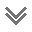

In [44]:
soup

In [45]:
#Date time modification
today=datetime.now()

In [46]:
yesterday_str="%s %d,%d" %(date.today().strftime("%b"),today.day-1,today.year)
yesterday_str

'Apr 20,2022'

In [47]:
#For cases
table=soup.findAll("table",{'id':"main_table_countries_yesterday"})
table

[<table class="table table-bordered table-hover main_table_countries" id="main_table_countries_yesterday" style="width:100%;margin-top: 0px !important;display:none;">
 <thead>
 <tr>
 <th width="1%">#</th>
 <th width="100">Country,<br/>Other</th>
 <th width="20">Total<br/>Cases</th>
 <th width="30">New<br/>Cases</th>
 <th width="30">Total<br/>Deaths</th>
 <th width="30">New<br/>Deaths</th>
 <th width="30">Total<br/>Recovered</th>
 <th width="30">New<br/>Recovered</th>
 <th width="30">Active<br/>Cases</th>
 <th width="30">Serious,<br/>Critical</th>
 <th width="30">Tot Cases/<br/>1M pop</th>
 <th width="30">Deaths/<br/>1M pop</th>
 <th width="30">Total<br/>Tests</th>
 <th width="30">Tests/<br/>
 <nobr>1M pop</nobr>
 </th>
 <th width="30">Population</th>
 <th style="display:none" width="30">Continent</th>
 <th width="30">1 Case<br/>every X ppl</th><th width="30">1 Death<br/>every X ppl</th><th width="30">1 Test<br/>every X ppl</th>
 <th width="30">New Cases/1M pop</th>
 <th width="30">New 

In [48]:

table2=soup2.findAll("table",{'id':"dtprv"})
table2

[]

In [49]:
table[0]

<table class="table table-bordered table-hover main_table_countries" id="main_table_countries_yesterday" style="width:100%;margin-top: 0px !important;display:none;">
<thead>
<tr>
<th width="1%">#</th>
<th width="100">Country,<br/>Other</th>
<th width="20">Total<br/>Cases</th>
<th width="30">New<br/>Cases</th>
<th width="30">Total<br/>Deaths</th>
<th width="30">New<br/>Deaths</th>
<th width="30">Total<br/>Recovered</th>
<th width="30">New<br/>Recovered</th>
<th width="30">Active<br/>Cases</th>
<th width="30">Serious,<br/>Critical</th>
<th width="30">Tot Cases/<br/>1M pop</th>
<th width="30">Deaths/<br/>1M pop</th>
<th width="30">Total<br/>Tests</th>
<th width="30">Tests/<br/>
<nobr>1M pop</nobr>
</th>
<th width="30">Population</th>
<th style="display:none" width="30">Continent</th>
<th width="30">1 Case<br/>every X ppl</th><th width="30">1 Death<br/>every X ppl</th><th width="30">1 Test<br/>every X ppl</th>
<th width="30">New Cases/1M pop</th>
<th width="30">New Deaths/1M pop</th>
<th w

In [50]:
containers=table[0].findAll("tr",{"style":""})
containers

[<tr>
 <th width="1%">#</th>
 <th width="100">Country,<br/>Other</th>
 <th width="20">Total<br/>Cases</th>
 <th width="30">New<br/>Cases</th>
 <th width="30">Total<br/>Deaths</th>
 <th width="30">New<br/>Deaths</th>
 <th width="30">Total<br/>Recovered</th>
 <th width="30">New<br/>Recovered</th>
 <th width="30">Active<br/>Cases</th>
 <th width="30">Serious,<br/>Critical</th>
 <th width="30">Tot Cases/<br/>1M pop</th>
 <th width="30">Deaths/<br/>1M pop</th>
 <th width="30">Total<br/>Tests</th>
 <th width="30">Tests/<br/>
 <nobr>1M pop</nobr>
 </th>
 <th width="30">Population</th>
 <th style="display:none" width="30">Continent</th>
 <th width="30">1 Case<br/>every X ppl</th><th width="30">1 Death<br/>every X ppl</th><th width="30">1 Test<br/>every X ppl</th>
 <th width="30">New Cases/1M pop</th>
 <th width="30">New Deaths/1M pop</th>
 <th width="30">Active Cases/1M pop</th>
 </tr>,
 <tr class="total_row_world">
 <td></td>
 <td style="text-align:left;">World</td>
 <td>507,700,062</td>
 <td

# Data Cleaning

In [51]:
title=containers[0]
del containers[0]
all_data=[]
clean= True
for country in containers:
    country_data=[]
    country_container=country.findAll("td")
    
    if country_container[1].text=="China":
        continue
    for i in range(1,len(country_container)):
        final_feature = country_container[i].text
        if clean:
            if i!=1 and i!= len(country_container)-1:
                final_feature = final_feature.replace(",","")
                
                if final_feature.find('+') != -1:
                    final_feature=final_feature.replace("+","")
                    final_feature = float(final_feature)
                elif final_feature.find('-') != -1:
                    final_feature=final_feature.replace("-","")
                    final_feature = float(final_feature)*-1
        if final_feature == 'N/A':
            final_feature = 0
        elif final_feature == "" or final_feature == " ":
             final_feature = 0
                        
        country_data.append(final_feature)
                
    all_data.append(country_data)      
                  
                    
                    
    

In [52]:
all_data

[['World',
  '507700062',
  817512.0,
  '6236176',
  3348.0,
  '459968341',
  1000840.0,
  '41495545',
  '41814',
  '65133',
  '800.0',
  0,
  0,
  0,
  'All',
  '\n',
  0,
  0,
  0,
  0,
  0],
 ['USA',
  '82553058',
  45204.0,
  '1017609 ',
  299.0,
  '80355389',
  34592.0,
  '1180060',
  '1492',
  '246798',
  '3042',
  '999047824',
  '2986727',
  '334495877 ',
  'North America',
  '4',
  '329',
  '0',
  '135',
  '0.9',
  '3,528'],
 ['India',
  '43052425',
  2451.0,
  '522116 ',
  54.0,
  '42516068',
  1589.0,
  '14241',
  '698',
  '30655',
  '372',
  '833377052',
  '593395',
  '1404421106 ',
  'Asia',
  '33',
  '2690',
  '2',
  '2',
  '0.04',
  '10'],
 ['Brazil',
  '30330629',
  18660.0,
  '662556 ',
  86.0,
  '29353398',
  12596.0,
  '314675',
  '8318',
  '140890',
  '3078',
  '63776166',
  '296249',
  '215278697 ',
  'South America',
  '7',
  '325',
  '3',
  '87',
  '0.4',
  '1,462'],
 ['France',
  '28076017',
  104007.0,
  '144799 ',
  185.0,
  '25618858',
  148402.0,
  '2312360',

In [53]:
df=pd.DataFrame(all_data)
df.drop([15,16,17,18,19,20],inplace=True,axis=1)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,World,507700062,817512.0,6236176,3348.0,459968341,1000840.0,41495545,41814,65133,800.0,0,0,0,All
1,USA,82553058,45204.0,1017609,299.0,80355389,34592.0,1180060,1492,246798,3042,999047824,2986727,334495877,North America
2,India,43052425,2451.0,522116,54.0,42516068,1589.0,14241,698,30655,372,833377052,593395,1404421106,Asia
3,Brazil,30330629,18660.0,662556,86.0,29353398,12596.0,314675,8318,140890,3078,63776166,296249,215278697,South America
4,France,28076017,104007.0,144799,185.0,25618858,148402.0,2312360,1677,428423,2210,266484045,4066382,65533452,Europe


In [54]:
column_labels=["Country","Total_cases","New_cases","Total_deaths","New_deaths","Total_recovered","New_recovered","Active_cases",
              "Serious/critical","Total_cases/1M","Deaths/1M","Total_tests","Tests/1M","Population","Continent"]
df.columns=column_labels

In [55]:
df

,Country,Total_cases,New_cases,Total_deaths,New_deaths,Total_recovered,New_recovered,Active_cases,Serious/critical,Total_cases/1M,Deaths/1M,Total_tests,Tests/1M,Population,Continent
0,World,507700062,817512.0,6236176,3348.0,459968341,1000840.0,41495545,41814,65133,800.0,0,0,0,All
1,USA,82553058,45204.0,1017609,299.0,80355389,34592.0,1180060,1492,246798,3042,999047824,2986727,334495877,North America
2,India,43052425,2451.0,522116,54.0,42516068,1589.0,14241,698,30655,372,833377052,593395,1404421106,Asia
3,Brazil,30330629,18660.0,662556,86.0,29353398,12596.0,314675,8318,140890,3078,63776166,296249,215278697,South America
4,France,28076017,104007.0,144799,185.0,25618858,148402.0,2312360,1677,428423,2210,266484045,4066382,65533452,Europe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215,Montserrat,177,0.0,2,0.0,174,0.0,1,0,35421,400,9587,1918551,4997,North America
216,Falkland Islands,128,0.0,0,0.0,0,0.0,0,0,34954,0,8632,2357182,3662,South America
217,Marshall Islands,15,0.0,0,0.0,7,0.0,8,0,250,0,0,0,59909,Australia/Oceania
218,Niue,8,1.0,0,0.0,7,0.0,1,0,4860,0,0,0,1646,Australia/Oceania


In [56]:
for label in df.columns:
    if label != 'Country' and label != 'Continent':
        df[label]=pd.to_numeric(df[label])

In [57]:
df["%Inc_cases"]=df["New_cases"]/df["Total_cases"]*100
df["%Inc_deaths"]=df["New_deaths"]/df["Total_deaths"]*100
df["%Inc_recovered"]=df["New_recovered"]/df["Total_recovered"]*100

In [58]:
df.head()

,Country,Total_cases,New_cases,Total_deaths,New_deaths,Total_recovered,New_recovered,Active_cases,Serious/critical,Total_cases/1M,Deaths/1M,Total_tests,Tests/1M,Population,Continent,%Inc_cases,%Inc_deaths,%Inc_recovered
0,World,507700062,817512.0,6236176,3348.0,459968341,1000840.0,41495545,41814,65133.0,800.0,0,0,0,All,0.161023,0.053687,0.217589
1,USA,82553058,45204.0,1017609,299.0,80355389,34592.0,1180060,1492,246798.0,3042.0,999047824,2986727,334495877,North America,0.054758,0.029383,0.043049
2,India,43052425,2451.0,522116,54.0,42516068,1589.0,14241,698,30655.0,372.0,833377052,593395,1404421106,Asia,0.005693,0.010343,0.003737
3,Brazil,30330629,18660.0,662556,86.0,29353398,12596.0,314675,8318,140890.0,3078.0,63776166,296249,215278697,South America,0.061522,0.012980,0.042912
4,France,28076017,104007.0,144799,185.0,25618858,148402.0,2312360,1677,428423.0,2210.0,266484045,4066382,65533452,Europe,0.370448,0.127763,0.579269


In [59]:
df.New_deaths = df.New_deaths.astype(int)
df.New_cases = df.New_cases.astype(int)
df.New_recovered=df.New_recovered.astype(int)
df['Total_cases/1M'] = df['Total_cases/1M'].astype(int)
df['Deaths/1M']=df['Deaths/1M'].astype(int)

In [60]:
df.dtypes

Country              object
Total_cases           int64
New_cases             int32
Total_deaths          int64
New_deaths            int32
Total_recovered       int64
New_recovered         int32
Active_cases          int64
Serious/critical      int64
Total_cases/1M        int32
Deaths/1M             int32
Total_tests           int64
Tests/1M              int64
Population            int64
Continent            object
%Inc_cases          float64
%Inc_deaths         float64
%Inc_recovered      float64
dtype: object

### writing the data into CSV file

In [61]:
df.to_csv(r'.\projectData.csv')

In [62]:
df=pd.read_csv(("./projectData.csv"))

In [63]:
df.head()

,Unnamed: 0,Country,Total_cases,New_cases,Total_deaths,New_deaths,Total_recovered,New_recovered,Active_cases,Serious/critical,Total_cases/1M,Deaths/1M,Total_tests,Tests/1M,Population,Continent,%Inc_cases,%Inc_deaths,%Inc_recovered
0,0,World,507700062,817512,6236176,3348,459968341,1000840,41495545,41814,65133,800,0,0,0,All,0.161023,0.053687,0.217589
1,1,USA,82553058,45204,1017609,299,80355389,34592,1180060,1492,246798,3042,999047824,2986727,334495877,North America,0.054758,0.029383,0.043049
2,2,India,43052425,2451,522116,54,42516068,1589,14241,698,30655,372,833377052,593395,1404421106,Asia,0.005693,0.010343,0.003737
3,3,Brazil,30330629,18660,662556,86,29353398,12596,314675,8318,140890,3078,63776166,296249,215278697,South America,0.061522,0.012980,0.042912
4,4,France,28076017,104007,144799,185,25618858,148402,2312360,1677,428423,2210,266484045,4066382,65533452,Europe,0.370448,0.127763,0.579269


# Scraping Vaccination data

In [64]:
page_1 = requests.get(URL_1,verify=False)

In [65]:
page_1.status_code

200

In [66]:
# get the HTML content from the page
pagecontent_1 = page_1.text

In [67]:
pagecontent_1

'<!doctype html><html lang="en" dir="ltr"><head><base href="https://news.google.com/"><meta name="referrer" content="origin"><link rel="canonical" href="https://news.google.com/covid19/map"><meta name="viewport" content="width=device-width,initial-scale=1,minimal-ui"><meta name="google-site-verification" content="AcBy5YFny2HQgVUCR18tO5YUTf6MpVlcJqGTd-a9-SI"><meta name="mobile-web-app-capable" content="yes"><meta name="apple-mobile-web-app-capable" content="yes"><meta name="application-name" content="News"><meta name="apple-mobile-web-app-title" content="News"><meta name="apple-mobile-web-app-status-bar-style" content="black"><meta name="theme-color" content="white"><meta name="msapplication-tap-highlight" content="no"><link rel="shortcut icon" href="https://lh3.googleusercontent.com/-DR60l-K8vnyi99NZovm9HlXyZwQ85GMDxiwJWzoasZYCUrPuUM_P_4Rb7ei03j-0nRs0c4F=w16" sizes="16x16"><link rel="shortcut icon" href="https://lh3.googleusercontent.com/-DR60l-K8vnyi99NZovm9HlXyZwQ85GMDxiwJWzoasZYCUrP

In [68]:
soup_1 = BeautifulSoup(pagecontent_1)

In [69]:
soup_1

<!DOCTYPE html>
<html dir="ltr" lang="en"><head><base href="https://news.google.com/"/><meta content="origin" name="referrer"/><link href="https://news.google.com/covid19/map" rel="canonical"/><meta content="width=device-width,initial-scale=1,minimal-ui" name="viewport"/><meta content="AcBy5YFny2HQgVUCR18tO5YUTf6MpVlcJqGTd-a9-SI" name="google-site-verification"/><meta content="yes" name="mobile-web-app-capable"/><meta content="yes" name="apple-mobile-web-app-capable"/><meta content="News" name="application-name"/><meta content="News" name="apple-mobile-web-app-title"/><meta content="black" name="apple-mobile-web-app-status-bar-style"/><meta content="white" name="theme-color"/><meta content="no" name="msapplication-tap-highlight"/><link href="https://lh3.googleusercontent.com/-DR60l-K8vnyi99NZovm9HlXyZwQ85GMDxiwJWzoasZYCUrPuUM_P_4Rb7ei03j-0nRs0c4F=w16" rel="shortcut icon" sizes="16x16"/><link href="https://lh3.googleusercontent.com/-DR60l-K8vnyi99NZovm9HlXyZwQ85GMDxiwJWzoasZYCUrPuUM_P_4

In [70]:
table1=soup_1.find('tbody', attrs={'class':'ppcUXd'})
table1

<tbody class="ppcUXd"><tr class="sgXwHf wdLSAe ROuVee" data-id="/m/02j71" jsaction="click:KoQL8" jslog="110767; track:click"><th class="l3HOY" role="rowheader" scope="row"><div class="TWa0lb"><div class="ggJ3df" jsaction="JIbuQc:ROTNpb" jslog="113728; track:click"><button aria-label="Unpinned" class="VfPpkd-Bz112c-LgbsSe yHy1rc eT1oJ DiOXab Vs1w5b" data-disable-idom="true" data-n-mid="/m/02j71" jsaction="click:cOuCgd; mousedown:UX7yZ; mouseup:lbsD7e; mouseenter:tfO1Yc; mouseleave:JywGue; touchstart:p6p2H; touchmove:FwuNnf; touchend:yfqBxc; touchcancel:JMtRjd; focus:AHmuwe; blur:O22p3e; contextmenu:mg9Pef;mlnRJb:fLiPzd;" jscontroller="soHxf"><div class="VfPpkd-Bz112c-Jh9lGc" jsname="s3Eaab"></div><div class="VfPpkd-Bz112c-J1Ukfc-LhBDec"></div><span aria-hidden="true" class="VfPpkd-kBDsod gsIK3e"><svg class="Xa3RBb NMm5M" focusable="false" height="16" viewbox="0 0 24 24" width="16"><path d="M0 0h24v24H0z" fill="none" stroke="#000" stroke-opacity=".008" stroke-width="0"></path><path d="M1

In [71]:
table1=soup_1.findAll("tbody",{'class':"ppcUXd"})
table1

[<tbody class="ppcUXd"><tr class="sgXwHf wdLSAe ROuVee" data-id="/m/02j71" jsaction="click:KoQL8" jslog="110767; track:click"><th class="l3HOY" role="rowheader" scope="row"><div class="TWa0lb"><div class="ggJ3df" jsaction="JIbuQc:ROTNpb" jslog="113728; track:click"><button aria-label="Unpinned" class="VfPpkd-Bz112c-LgbsSe yHy1rc eT1oJ DiOXab Vs1w5b" data-disable-idom="true" data-n-mid="/m/02j71" jsaction="click:cOuCgd; mousedown:UX7yZ; mouseup:lbsD7e; mouseenter:tfO1Yc; mouseleave:JywGue; touchstart:p6p2H; touchmove:FwuNnf; touchend:yfqBxc; touchcancel:JMtRjd; focus:AHmuwe; blur:O22p3e; contextmenu:mg9Pef;mlnRJb:fLiPzd;" jscontroller="soHxf"><div class="VfPpkd-Bz112c-Jh9lGc" jsname="s3Eaab"></div><div class="VfPpkd-Bz112c-J1Ukfc-LhBDec"></div><span aria-hidden="true" class="VfPpkd-kBDsod gsIK3e"><svg class="Xa3RBb NMm5M" focusable="false" height="16" viewbox="0 0 24 24" width="16"><path d="M0 0h24v24H0z" fill="none" stroke="#000" stroke-opacity=".008" stroke-width="0"></path><path d="M

In [72]:
containers=table1[0].findAll("tr",{"style":""})
containers

[<tr class="sgXwHf wdLSAe ROuVee" data-id="/m/02j71" jsaction="click:KoQL8" jslog="110767; track:click"><th class="l3HOY" role="rowheader" scope="row"><div class="TWa0lb"><div class="ggJ3df" jsaction="JIbuQc:ROTNpb" jslog="113728; track:click"><button aria-label="Unpinned" class="VfPpkd-Bz112c-LgbsSe yHy1rc eT1oJ DiOXab Vs1w5b" data-disable-idom="true" data-n-mid="/m/02j71" jsaction="click:cOuCgd; mousedown:UX7yZ; mouseup:lbsD7e; mouseenter:tfO1Yc; mouseleave:JywGue; touchstart:p6p2H; touchmove:FwuNnf; touchend:yfqBxc; touchcancel:JMtRjd; focus:AHmuwe; blur:O22p3e; contextmenu:mg9Pef;mlnRJb:fLiPzd;" jscontroller="soHxf"><div class="VfPpkd-Bz112c-Jh9lGc" jsname="s3Eaab"></div><div class="VfPpkd-Bz112c-J1Ukfc-LhBDec"></div><span aria-hidden="true" class="VfPpkd-kBDsod gsIK3e"><svg class="Xa3RBb NMm5M" focusable="false" height="16" viewbox="0 0 24 24" width="16"><path d="M0 0h24v24H0z" fill="none" stroke="#000" stroke-opacity=".008" stroke-width="0"></path><path d="M17 4v7l2 3v2h-6v5l-1 1

In [73]:
tables = pd.read_html('https://news.google.com/covid19/map?hl=en-US&gl=US&ceid=US%3Aen&state=4')
vac_df = tables[0]  # Save first table in variable df1
#print('First Table')
vac_df

,Location,Total doses given,New doses given (1d*),New doses given (60d),People fully vaccinated,% of pop. fully vaccinated
0,Worldwide,11493541038,5610182,NaN,4627183951,59.5%
1,China (Mainland),3317463000,No data,NaN,1246769000,88.9%
2,India,1868475798,744947,NaN,845392713,62.1%
3,United States,570485199,19387,NaN,219047079,66.5%
4,Brazil,426002158,700965,NaN,163106069,77.2%
5,Indonesia,394736427,1487536,NaN,163036814,61.1%
6,Japan,266889958,428374,NaN,101238428,80.4%
7,Bangladesh,256016234,208075,NaN,115817367,68.8%
8,Pakistan,244920963,159016,NaN,120936554,55.2%
9,Vietnam,203144374,No data,NaN,77754108,80.8%


In [74]:
#vac_df[['Location','% of pop. fully vaccinated']]
#vac_df['% of pop. fully vaccinated']

In [75]:
#vac_df_pop


# Data Cleaning

In [76]:
column_labels=["location","total_doses","New_doses_oneday","new_doses_sixtydays","fully_vaccinated","percentage"]
vac_df.columns=column_labels
vac_df.head()

,location,total_doses,New_doses_oneday,new_doses_sixtydays,fully_vaccinated,percentage
0,Worldwide,11493541038,5610182,NaN,4627183951,59.5%
1,China (Mainland),3317463000,No data,NaN,1246769000,88.9%
2,India,1868475798,744947,NaN,845392713,62.1%
3,United States,570485199,19387,NaN,219047079,66.5%
4,Brazil,426002158,700965,NaN,163106069,77.2%


In [77]:
vac_df.fillna(value = 0, inplace = True)
vac_df.New_doses_oneday=vac_df.New_doses_oneday.replace("No data",0)
#vac_df.total_doses = vac_df.total_doses.astype(int)
#vac_df.New_doses_oneday = vac_df.New_doses_oneday.astype(int)
#vac_df.new_doses_sixtydays = vac_df.new_doses_sixtydays.astype(int)
#vac_df.fully_vaccinated = vac_df.fully_vaccinated.astype(int)


In [78]:
vac_df

,location,total_doses,New_doses_oneday,new_doses_sixtydays,fully_vaccinated,percentage
0,Worldwide,11493541038,5610182,0.0,4627183951,59.5%
1,China (Mainland),3317463000,0,0.0,1246769000,88.9%
2,India,1868475798,744947,0.0,845392713,62.1%
3,United States,570485199,19387,0.0,219047079,66.5%
4,Brazil,426002158,700965,0.0,163106069,77.2%
5,Indonesia,394736427,1487536,0.0,163036814,61.1%
6,Japan,266889958,428374,0.0,101238428,80.4%
7,Bangladesh,256016234,208075,0.0,115817367,68.8%
8,Pakistan,244920963,159016,0.0,120936554,55.2%
9,Vietnam,203144374,0,0.0,77754108,80.8%


In [79]:
vac_df.isnull().sum()

location               0
total_doses            0
New_doses_oneday       0
new_doses_sixtydays    0
fully_vaccinated       0
percentage             0
dtype: int64

In [80]:
vac_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41 entries, 0 to 40
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   location             41 non-null     object 
 1   total_doses          41 non-null     int64  
 2   New_doses_oneday     41 non-null     object 
 3   new_doses_sixtydays  41 non-null     float64
 4   fully_vaccinated     41 non-null     int64  
 5   percentage           41 non-null     object 
dtypes: float64(1), int64(2), object(3)
memory usage: 2.0+ KB


In [81]:
vac_df=pd.DataFrame(vac_df)
vac_df

,location,total_doses,New_doses_oneday,new_doses_sixtydays,fully_vaccinated,percentage
0,Worldwide,11493541038,5610182,0.0,4627183951,59.5%
1,China (Mainland),3317463000,0,0.0,1246769000,88.9%
2,India,1868475798,744947,0.0,845392713,62.1%
3,United States,570485199,19387,0.0,219047079,66.5%
4,Brazil,426002158,700965,0.0,163106069,77.2%
5,Indonesia,394736427,1487536,0.0,163036814,61.1%
6,Japan,266889958,428374,0.0,101238428,80.4%
7,Bangladesh,256016234,208075,0.0,115817367,68.8%
8,Pakistan,244920963,159016,0.0,120936554,55.2%
9,Vietnam,203144374,0,0.0,77754108,80.8%


In [82]:
selected_columns = vac_df['location']
#print(selected_columns)
new_df_us = vac_df[selected_columns=='United States'].copy()
new_df_us
new_df_india = vac_df[selected_columns=='India'].copy()
new_df_india=pd.DataFrame(new_df_india).reset_index()
new_df_us=pd.DataFrame(new_df_us).reset_index()
print(new_df_india)
print(new_df_us)

,location,total_doses,New_doses_oneday,new_doses_sixtydays,fully_vaccinated,percentage
3,United States,570485199,19387,0.0,219047079,66.5%


   index location  total_doses New_doses_oneday  new_doses_sixtydays  \
0      2    India   1868475798           744947                  0.0   

   fully_vaccinated percentage  
0         845392713      62.1%  
   index       location  total_doses New_doses_oneday  new_doses_sixtydays  \
0      3  United States    570485199            19387                  0.0   

   fully_vaccinated percentage  
0         219047079      66.5%  


In [83]:
mask1 = vac_df['location'].values =='United States'
mask2 = vac_df['location'].values =='India' 
# using loc() method
df_new_vac = vac_df.loc[mask1]
df_new_vac=df_new_vac.append(vac_df.loc[mask2])
df_new_vac=pd.DataFrame(df_new_vac).reset_index()
df_new_vac

,index,location,total_doses,New_doses_oneday,new_doses_sixtydays,fully_vaccinated,percentage
0,3,United States,570485199,19387,0.0,219047079,66.5%
1,2,India,1868475798,744947,0.0,845392713,62.1%


,total_doses,fully_vaccinated
total_doses,1.000000,0.999595
fully_vaccinated,0.999595,1.000000


<Figure size 720x360 with 0 Axes>

<AxesSubplot:>

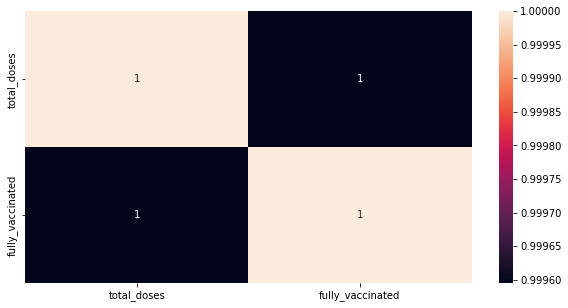

In [84]:
vac_df[['New_doses_oneday','total_doses','fully_vaccinated']].corr()

plt.figure(figsize=(10,5))
sns.heatmap(vac_df[['New_doses_oneday','total_doses','fully_vaccinated']].corr(), annot=True)
plt.show()

In [85]:
vac_df.to_csv(r'.\projectData_vac_data1.csv')

In [86]:
vac_df=pd.read_csv(("./projectData_vac_data1.csv"))
vac_df.head()

,Unnamed: 0,location,total_doses,New_doses_oneday,new_doses_sixtydays,fully_vaccinated,percentage
0,0,Worldwide,11493541038,5610182,0.0,4627183951,59.5%
1,1,China (Mainland),3317463000,0,0.0,1246769000,88.9%
2,2,India,1868475798,744947,0.0,845392713,62.1%
3,3,United States,570485199,19387,0.0,219047079,66.5%
4,4,Brazil,426002158,700965,0.0,163106069,77.2%


In [87]:
s_c=vac_df[['location','percentage']]
vac_df_pop=s_c.copy()
vac_df_pop

,location,percentage
0,Worldwide,59.5%
1,China (Mainland),88.9%
2,India,62.1%
3,United States,66.5%
4,Brazil,77.2%
5,Indonesia,61.1%
6,Japan,80.4%
7,Bangladesh,68.8%
8,Pakistan,55.2%
9,Vietnam,80.8%


In [88]:
vac_df_pop.dtypes

location      object
percentage    object
dtype: object

In [89]:
#vac_df_pop['percentage'] = vac_df_pop['percentage'].apply(lambda x:re.compile('\d').findall(x))
#vac_df_pop['percentage'] = vac_df_pop['percentage'].apply(lambda x:''.join(x))
vac_df_pop['percentage'] = vac_df_pop['percentage'].apply(lambda x:float(x.strip('%')))


In [90]:
vac_df_pop.dtypes

location       object
percentage    float64
dtype: object

In [91]:
vac_df_pop['percentage']=vac_df_pop['percentage'].astype(int)
vac_df_pop.head()

,location,percentage
0,Worldwide,59
1,China (Mainland),88
2,India,62
3,United States,66
4,Brazil,77


In [92]:
vac_df_pop1=vac_df_pop[:5].copy()
vac_df_pop1
print(vac_df_pop['percentage'].nlargest(n=5))
#vac_df_pop1['percentage']=vac_df_pop['percentage'].nlargest(n=5)

,location,percentage
0,Worldwide,59
1,China (Mainland),88
2,India,62
3,United States,66
4,Brazil,77


39    92
33    91
1     88
40    88
20    86
Name: percentage, dtype: int32


<Figure size 1440x720 with 0 Axes>

<AxesSubplot:xlabel='location', ylabel='percentage'>

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'Worldwide'),
  Text(1, 0, 'China (Mainland)'),
  Text(2, 0, 'India'),
  Text(3, 0, 'United States'),
  Text(4, 0, 'Brazil')])

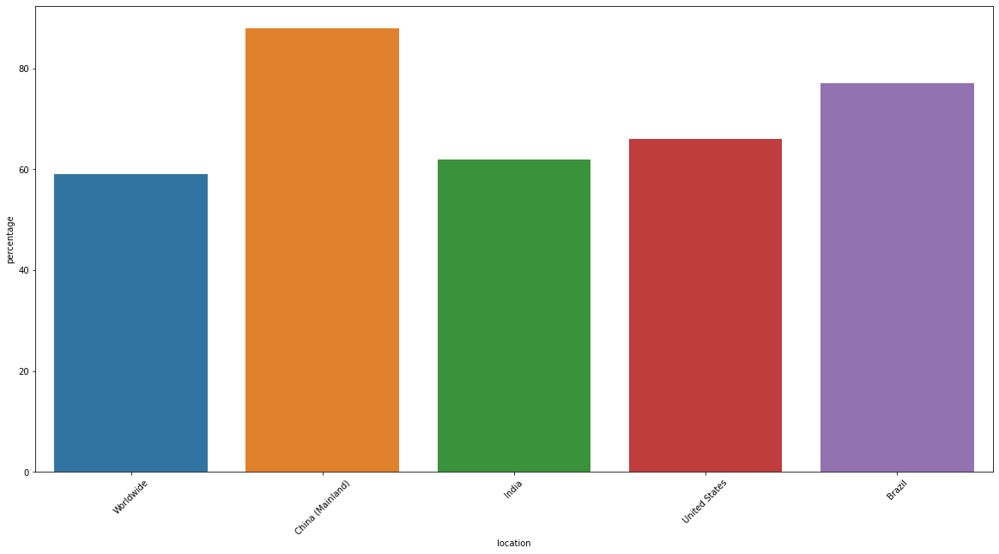

In [93]:
plt.figure(figsize=(20,10))
sns.barplot(x='location',y='percentage',data=vac_df_pop1)
plt.xticks(rotation=45)
plt.show()

<Figure size 1440x720 with 0 Axes>

<AxesSubplot:xlabel='location', ylabel='percentage'>

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39]),
 [Text(0, 0, 'Cambodia'),
  Text(1, 0, 'Chile'),
  Text(2, 0, 'China (Mainland)'),
  Text(3, 0, 'Cuba'),
  Text(4, 0, 'South Korea'),
  Text(5, 0, 'Spain'),
  Text(6, 0, 'Australia'),
  Text(7, 0, 'Argentina'),
  Text(8, 0, 'Canada'),
  Text(9, 0, 'Peru'),
  Text(10, 0, 'Japan'),
  Text(11, 0, 'Vietnam'),
  Text(12, 0, 'Malaysia'),
  Text(13, 0, 'Italy'),
  Text(14, 0, 'France'),
  Text(15, 0, 'Taiwan'),
  Text(16, 0, 'Brazil'),
  Text(17, 0, 'Germany'),
  Text(18, 0, 'Thailand'),
  Text(19, 0, 'United Kingdom'),
  Text(20, 0, 'Saudi Arabia'),
  Text(21, 0, 'Colombia'),
  Text(22, 0, 'Bangladesh'),
  Text(23, 0, 'Iran'),
  Text(24, 0, 'United States'),
  Text(25, 0, 'Sri Lanka'),
  Text(26, 0, 'Morocco'),
  Text(27, 0, 'Nepal'),
  Text(28, 0, 'Mexico'),
  Text(29, 0, 'Turkey'),
  Text(30, 0, 'India'),
 

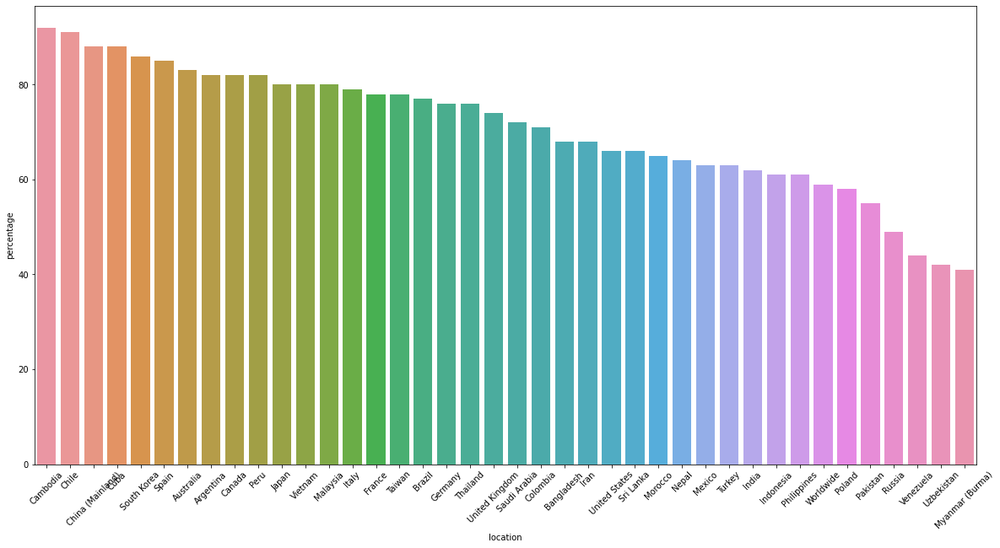

In [94]:
plt.figure(figsize=(20,10))
sns.barplot(x='location',y='percentage',data=vac_df_pop.nlargest(40, 'percentage'))
plt.xticks(rotation=45)
plt.show()

In [95]:
#vac_df_pop['percentage'].nlargest(n=5)

In [96]:
#plt.figure(figsize=(10,5))
#vac_df_pop.head()['location'].value_counts().plot(kind='bar')

# Scraping California Vaccination Data for Vaccination breakthrough analysis.

In [97]:
tables = pd.read_html('https://github.com/datadesk/california-coronavirus-scrapers/blob/0783c4a6626c7b0655166b946a38b9d3b95d82bd/vaccine-breakthrough-cases/data/latest.csv')
vac_df_us = tables[0]  # Save first table in variable df1
#print('First Table')
vac_df_us

,Unnamed: 0,date,area,area_type,unvaccinated_cases,vaccinated_cases,boosted_cases,unvaccinated_hosp,vaccinated_hosp,boosted_hosp,...,population_boosted,unvaccinated_cases_per_100k,vaccinated_cases_per_100k,boosted_cases_per_100k,unvaccinated_hosp_per_100k,vaccinated_hosp_per_100k,boosted_hosp_per_100k,unvaccinated_deaths_per_100k,vaccinated_deaths_per_100k,boosted_deaths_per_100k
0,NaN,2021-02-01,California,State,13804,22,0,792,0,0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,2021-02-02,California,State,11352,17,0,633,0,0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,2021-02-03,California,State,10328,26,0,567,0,0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,2021-02-04,California,State,9003,17,0,498,0,0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,2021-02-05,California,State,8396,17,0,511,0,0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
352,NaN,2022-01-19,California,State,35176,30940,12547,524,308,111,...,10681888,598.589394,183.195511,102.678478,11.634234,2.017738,0.990997,1.744993,0.206152,0.076231
353,NaN,2022-01-20,California,State,31800,28333,11793,463,248,97,...,10835506,580.715760,176.039390,99.442913,11.109786,1.932992,0.961126,1.755677,0.210688,0.077787
354,NaN,2022-01-21,California,State,27000,23298,10759,394,242,85,...,11014517,562.632350,165.858204,95.843642,10.388356,1.843075,0.922160,1.816026,0.223995,0.081710
355,NaN,2022-01-22,California,State,13877,11821,6145,373,183,53,...,11109538,550.063727,159.676790,92.935586,9.958380,1.754064,0.880839,1.750924,0.218674,0.086155


#Data Cleaning

In [98]:
vac_df_us.fillna(value = 0, inplace = True)

In [99]:
vac_df_us

,Unnamed: 0,date,area,area_type,unvaccinated_cases,vaccinated_cases,boosted_cases,unvaccinated_hosp,vaccinated_hosp,boosted_hosp,...,population_boosted,unvaccinated_cases_per_100k,vaccinated_cases_per_100k,boosted_cases_per_100k,unvaccinated_hosp_per_100k,vaccinated_hosp_per_100k,boosted_hosp_per_100k,unvaccinated_deaths_per_100k,vaccinated_deaths_per_100k,boosted_deaths_per_100k
0,0.0,2021-02-01,California,State,13804,22,0,792,0,0,...,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.0,2021-02-02,California,State,11352,17,0,633,0,0,...,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.0,2021-02-03,California,State,10328,26,0,567,0,0,...,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.0,2021-02-04,California,State,9003,17,0,498,0,0,...,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.0,2021-02-05,California,State,8396,17,0,511,0,0,...,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
352,0.0,2022-01-19,California,State,35176,30940,12547,524,308,111,...,10681888,598.589394,183.195511,102.678478,11.634234,2.017738,0.990997,1.744993,0.206152,0.076231
353,0.0,2022-01-20,California,State,31800,28333,11793,463,248,97,...,10835506,580.715760,176.039390,99.442913,11.109786,1.932992,0.961126,1.755677,0.210688,0.077787
354,0.0,2022-01-21,California,State,27000,23298,10759,394,242,85,...,11014517,562.632350,165.858204,95.843642,10.388356,1.843075,0.922160,1.816026,0.223995,0.081710
355,0.0,2022-01-22,California,State,13877,11821,6145,373,183,53,...,11109538,550.063727,159.676790,92.935586,9.958380,1.754064,0.880839,1.750924,0.218674,0.086155


<AxesSubplot:xlabel='unvaccinated_cases', ylabel='vaccinated_cases'>

<Figure size 720x360 with 0 Axes>

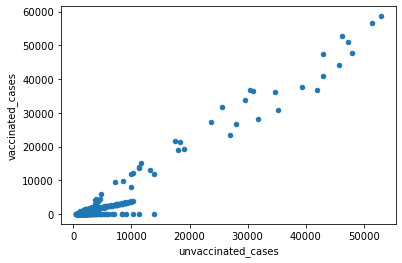

<Figure size 720x360 with 0 Axes>

<AxesSubplot:xlabel='unvaccinated_cases', ylabel='boosted_cases'>

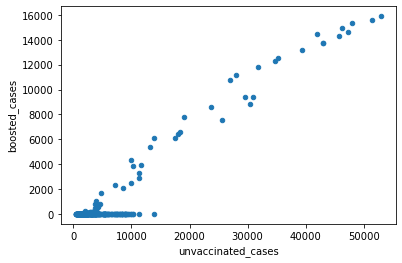

In [100]:
vac_df_us.plot.scatter(x="unvaccinated_cases",y="vaccinated_cases")
plt.figure(figsize=(10,5))
plt.show()
#sns.relplot(x="unvaccinated_cases", y="vaccinated_cases", hue="boosted_cases", data=vac_df_us);
## scatter pllot - num to num
#plot the scatter plot of balance and age variable in data
vac_df_us.plot.scatter(x="unvaccinated_cases",y="boosted_cases")
plt.show()


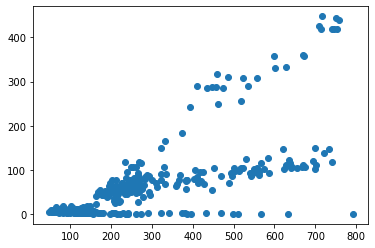

<AxesSubplot:xlabel='unvaccinated_hosp', ylabel='boosted_hosp'>

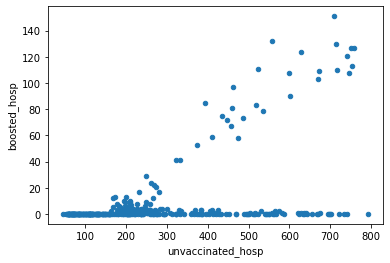

In [101]:
plt.scatter(vac_df_us.unvaccinated_hosp,vac_df_us.vaccinated_hosp)
plt.show()

#plot the scatter plot of balance and age variable in data
vac_df_us.plot.scatter(x="unvaccinated_hosp",y="boosted_hosp")
plt.show()

In [102]:
vac_df_us.unvaccinated_cases = vac_df_us.unvaccinated_cases.astype(int)
vac_df_us.vaccinated_cases = vac_df_us.vaccinated_cases.astype(int)
vac_df_us.boosted_cases = vac_df_us.boosted_cases.astype(int)
vac_df_us.unvaccinated_hosp = vac_df_us.unvaccinated_hosp.astype(int)
vac_df_us.vaccinated_hosp = vac_df_us.vaccinated_hosp.astype(int)
vac_df_us.boosted_hosp = vac_df_us.boosted_hosp.astype(int)
vac_df_us.population_boosted = vac_df_us.population_boosted.astype(int)
vac_df_us.unvaccinated_cases_per_100k = vac_df_us.unvaccinated_cases_per_100k.astype(int)
vac_df_us.boosted_cases_per_100k = vac_df_us.boosted_cases_per_100k.astype(int)
date = vac_df_us.date.str.split('-', expand =True)

In [103]:

vac_df_us.vaccinated_cases_per_100k = vac_df_us.vaccinated_cases_per_100k.astype(int)
vac_df_us.unvaccinated_hosp_per_100k = vac_df_us.unvaccinated_hosp_per_100k.astype(int)
vac_df_us.vaccinated_hosp_per_100k = vac_df_us.vaccinated_hosp_per_100k.astype(int)
vac_df_us.boosted_hosp_per_100k = vac_df_us.boosted_hosp_per_100k.astype(int)
vac_df_us.unvaccinated_deaths_per_100k = vac_df_us.unvaccinated_deaths_per_100k.astype(int)
vac_df_us.vaccinated_deaths_per_100k = vac_df_us.vaccinated_deaths_per_100k.astype(int)
vac_df_us.boosted_deaths_per_100k = vac_df_us.boosted_deaths_per_100k.astype(int)

In [104]:
vac_df_us.isna().sum()

Unnamed: 0                      0
date                            0
area                            0
area_type                       0
unvaccinated_cases              0
vaccinated_cases                0
boosted_cases                   0
unvaccinated_hosp               0
vaccinated_hosp                 0
boosted_hosp                    0
unvaccinated_deaths             0
vaccinated_deaths               0
boosted_deaths                  0
population_unvaccinated         0
population_vaccinated           0
population_boosted              0
unvaccinated_cases_per_100k     0
vaccinated_cases_per_100k       0
boosted_cases_per_100k          0
unvaccinated_hosp_per_100k      0
vaccinated_hosp_per_100k        0
boosted_hosp_per_100k           0
unvaccinated_deaths_per_100k    0
vaccinated_deaths_per_100k      0
boosted_deaths_per_100k         0
dtype: int64

### Data Visualization

### Plotting the graph of Total recovered covid cases,Active covid cases and total deaths I have used plotty for better understanding of percentages(hover on each bar)

In [105]:
cases=df[["Total_recovered","Active_cases","Total_deaths"]].loc[0]
cases_df=pd.DataFrame(cases).reset_index()
cases_df.columns=["Type","Total"]
cases_df["Percentage"]=np.round(100*cases_df["Total"]/np.sum(cases_df["Total"]),2)
cases_df["virus"]=["COVID-19" for i in range(len(cases_df))]
cases_df

,Type,Total,Percentage,virus
0,Total_recovered,459968341,90.60,COVID-19
1,Active_cases,41495545,8.17,COVID-19
2,Total_deaths,6236176,1.23,COVID-19


In [106]:
fig=px.bar(cases_df,x="virus",y="Percentage",color="Type",hover_data=["Total"])
fig.show()
plt.figure(figsize=(10,5))

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

### From the above graph it is clearly shows that total recovery data is high and if you hover on each data we can see the percentage of each data

,Active_cases,Total_recovered,Total_deaths
Active_cases,1.000000,0.990713,0.988150
Total_recovered,0.990713,1.000000,0.997702
Total_deaths,0.988150,0.997702,1.000000


<Figure size 720x360 with 0 Axes>

<AxesSubplot:>

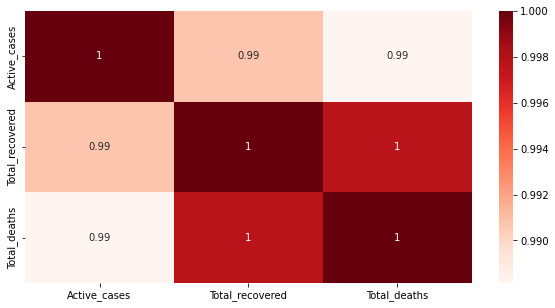

In [107]:
df[['Active_cases','Total_recovered','Total_deaths']].corr()

plt.figure(figsize=(10,5))
sns.heatmap(df[['Active_cases','Total_recovered','Total_deaths']].corr(), annot=True, cmap = 'Reds')
plt.show()

In [108]:
df.head()

,Unnamed: 0,Country,Total_cases,New_cases,Total_deaths,New_deaths,Total_recovered,New_recovered,Active_cases,Serious/critical,Total_cases/1M,Deaths/1M,Total_tests,Tests/1M,Population,Continent,%Inc_cases,%Inc_deaths,%Inc_recovered
0,0,World,507700062,817512,6236176,3348,459968341,1000840,41495545,41814,65133,800,0,0,0,All,0.161023,0.053687,0.217589
1,1,USA,82553058,45204,1017609,299,80355389,34592,1180060,1492,246798,3042,999047824,2986727,334495877,North America,0.054758,0.029383,0.043049
2,2,India,43052425,2451,522116,54,42516068,1589,14241,698,30655,372,833377052,593395,1404421106,Asia,0.005693,0.010343,0.003737
3,3,Brazil,30330629,18660,662556,86,29353398,12596,314675,8318,140890,3078,63776166,296249,215278697,South America,0.061522,0.012980,0.042912
4,4,France,28076017,104007,144799,185,25618858,148402,2312360,1677,428423,2210,266484045,4066382,65533452,Europe,0.370448,0.127763,0.579269


In [109]:
df.groupby('Continent')['Total_cases/1M'].median()

Continent
Africa                 4799.0
All                   65133.0
Asia                  72195.0
Australia/Oceania     56380.0
Europe               319717.0
North America        149798.0
South America        111367.0
Name: Total_cases/1M, dtype: float64

<Figure size 720x360 with 0 Axes>

<AxesSubplot:xlabel='Continent', ylabel='Total_cases/1M'>

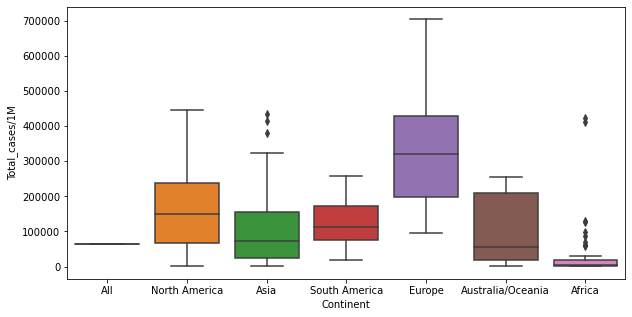

In [110]:
plt.figure(figsize=(10,5))
sns.boxplot(df['Continent'], df['Total_cases/1M'])
plt.show()

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

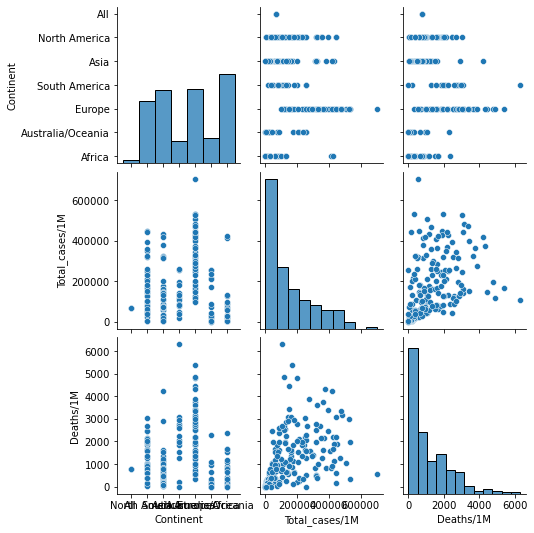

In [111]:
plt.figure(figsize=(10,5))
sns.pairplot(data = df, vars=['Continent','Total_cases/1M','Deaths/1M'])
plt.show()


### Plotting the graph of new recovered cases,new cases and new deaths of covid.(hover on each bar for better understanding)

In [112]:
cases=df[["New_recovered","New_cases","New_deaths"]].loc[0]
cases_df=pd.DataFrame(cases).reset_index()
cases_df.columns=["Type","Total"]
cases_df["Percentage"]=np.round(100*cases_df["Total"]/np.sum(cases_df["Total"]),2)
cases_df["virus"]=["COVID-19" for i in range(len(cases_df))]
fig=px.bar(cases_df,x="virus",y="Percentage",color="Type",hover_data=["Total"])
fig.show()

### And from the above graph we can say that there are no new death cases recorded

In [113]:
per=np.round(df[["%Inc_cases","%Inc_deaths","%Inc_recovered"]].loc[0],2)
per_df=pd.DataFrame(per)
per_df

,0
%Inc_cases,0.16
%Inc_deaths,0.05
%Inc_recovered,0.22


In [114]:
per_df.columns=["Percentage"]
per_df

,Percentage
%Inc_cases,0.16
%Inc_deaths,0.05
%Inc_recovered,0.22


#### PLotting the graph of percentage of Increased cases,Increased deaths and inc recovered data(hover on each bar for better understanding)

In [115]:
fig=go.Figure()
fig.add_trace(go.Bar(x= per_df.index,y=per_df['Percentage'],marker_color=["yellow","blue","red"]))
#fig.show()

### %Inc deaths are very low and %recovered rate is high

# Plotting graph for No of active cases for each continent

In [116]:
continet_df=df.groupby("Continent").sum().drop("All")


In [117]:
df.columns

Index(['Unnamed: 0', 'Country', 'Total_cases', 'New_cases', 'Total_deaths',
       'New_deaths', 'Total_recovered', 'New_recovered', 'Active_cases',
       'Serious/critical', 'Total_cases/1M', 'Deaths/1M', 'Total_tests',
       'Tests/1M', 'Population', 'Continent', '%Inc_cases', '%Inc_deaths',
       '%Inc_recovered'],
      dtype='object')

In [118]:
continet_df

,Unnamed: 0,Total_cases,New_cases,Total_deaths,New_deaths,Total_recovered,New_recovered,Active_cases,Serious/critical,Total_cases/1M,Deaths/1M,Total_tests,Tests/1M,Population,%Inc_cases,%Inc_deaths,%Inc_recovered
Continent,,,,,,,,,,,,,,,,,
Africa,7831,11854737,5249,253661,71,10009500,2621,482805,957,1841633,17918,100897809,10485576,1397705453,1.552245,1.212740,2.074398
Asia,3314,146246781,199633,1413175,577,123628243,218057,3361863,13232,5196620,31231,1924928353,80511564,3220430952,11.636606,2.175252,7.231342
Australia/Oceania,2707,6713801,65199,10160,69,6193614,64751,438054,183,1646395,6222,77011050,14145595,43345658,18.022339,3.739881,7.992430
Europe,3263,188330395,451369,1806028,1978,164393325,648312,12125723,9236,15020358,111748,2645809100,197738505,748441644,11.943944,6.525421,8.693061
North America,5680,97701716,69737,1455579,500,93760683,44579,2474928,7030,6607957,51022,1117617832,88182260,597417470,4.811152,1.353009,1.897112
South America,1076,56640443,23484,1292770,145,50527249,20335,643001,10953,1735462,31478,218660167,12563025,437156526,0.689610,0.116373,0.339828


In [119]:
continet_df=continet_df.reset_index()

In [120]:
continet_df

,Continent,Unnamed: 0,Total_cases,New_cases,Total_deaths,New_deaths,Total_recovered,New_recovered,Active_cases,Serious/critical,Total_cases/1M,Deaths/1M,Total_tests,Tests/1M,Population,%Inc_cases,%Inc_deaths,%Inc_recovered
0,Africa,7831,11854737,5249,253661,71,10009500,2621,482805,957,1841633,17918,100897809,10485576,1397705453,1.552245,1.212740,2.074398
1,Asia,3314,146246781,199633,1413175,577,123628243,218057,3361863,13232,5196620,31231,1924928353,80511564,3220430952,11.636606,2.175252,7.231342
2,Australia/Oceania,2707,6713801,65199,10160,69,6193614,64751,438054,183,1646395,6222,77011050,14145595,43345658,18.022339,3.739881,7.992430
3,Europe,3263,188330395,451369,1806028,1978,164393325,648312,12125723,9236,15020358,111748,2645809100,197738505,748441644,11.943944,6.525421,8.693061
4,North America,5680,97701716,69737,1455579,500,93760683,44579,2474928,7030,6607957,51022,1117617832,88182260,597417470,4.811152,1.353009,1.897112
5,South America,1076,56640443,23484,1292770,145,50527249,20335,643001,10953,1735462,31478,218660167,12563025,437156526,0.689610,0.116373,0.339828


In [121]:
def continent_visualization(v_list):
    colors = ['peru','lightgreen','slategrey','lightpink','lightblue','coral']
    for label in v_list:
        c_df=continet_df[['Continent',label]]
        c_df['Percentage']=np.round(100*c_df[label]/np.sum(c_df[label]),2)
        c_df['virus']=["Covid-19" for i in range (len(c_df))]
        
    fig=px.bar(c_df,x="virus",y="Percentage",color="Continent",hover_data=[label])
    fig.update_layout(title= {"text":f"{label}"})
    fig.show()

In [122]:
cases_list=["Total_cases","New_cases","Active_cases","Serious/critical","Total_cases/1M"]
deaths_list=["Total_deaths","New_deaths","Deaths/1M"]
recovered_list=["Total_recovered","New_recovered","%Inc_recovered"]


### % of Active cases are high in Europe and less in South America and Africa

In [123]:
#continent_visualization(cases_list)

In [124]:
continet_df

,Continent,Unnamed: 0,Total_cases,New_cases,Total_deaths,New_deaths,Total_recovered,New_recovered,Active_cases,Serious/critical,Total_cases/1M,Deaths/1M,Total_tests,Tests/1M,Population,%Inc_cases,%Inc_deaths,%Inc_recovered
0,Africa,7831,11854737,5249,253661,71,10009500,2621,482805,957,1841633,17918,100897809,10485576,1397705453,1.552245,1.212740,2.074398
1,Asia,3314,146246781,199633,1413175,577,123628243,218057,3361863,13232,5196620,31231,1924928353,80511564,3220430952,11.636606,2.175252,7.231342
2,Australia/Oceania,2707,6713801,65199,10160,69,6193614,64751,438054,183,1646395,6222,77011050,14145595,43345658,18.022339,3.739881,7.992430
3,Europe,3263,188330395,451369,1806028,1978,164393325,648312,12125723,9236,15020358,111748,2645809100,197738505,748441644,11.943944,6.525421,8.693061
4,North America,5680,97701716,69737,1455579,500,93760683,44579,2474928,7030,6607957,51022,1117617832,88182260,597417470,4.811152,1.353009,1.897112
5,South America,1076,56640443,23484,1292770,145,50527249,20335,643001,10953,1735462,31478,218660167,12563025,437156526,0.689610,0.116373,0.339828


# percentage of active carona cases continent wise

In [125]:
df_cases1=continet_df.groupby(continet_df['Continent'])['Active_cases'].sum()
df_cases1

Continent
Africa                 482805
Asia                  3361863
Australia/Oceania      438054
Europe               12125723
North America         2474928
South America          643001
Name: Active_cases, dtype: int64

<Figure size 720x720 with 0 Axes>

<AxesSubplot:ylabel='Active_cases'>

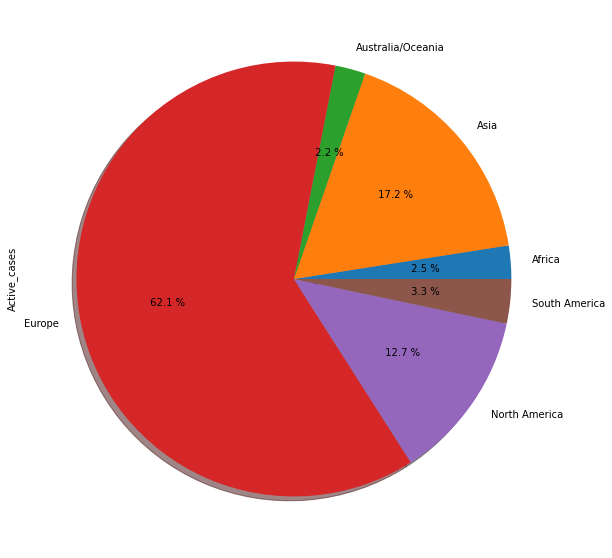

In [126]:
plt.figure(figsize=(10,10))
df_cases1.plot(kind='pie',  autopct ='% 1.1f %%', shadow = True)


In [127]:
df=df.drop([len(df)-1])
country_df=df.drop([0])
country_df

,Unnamed: 0,Country,Total_cases,New_cases,Total_deaths,New_deaths,Total_recovered,New_recovered,Active_cases,Serious/critical,Total_cases/1M,Deaths/1M,Total_tests,Tests/1M,Population,Continent,%Inc_cases,%Inc_deaths,%Inc_recovered
1,1,USA,82553058,45204,1017609,299,80355389,34592,1180060,1492,246798,3042,999047824,2986727,334495877,North America,0.054758,0.029383,0.043049
2,2,India,43052425,2451,522116,54,42516068,1589,14241,698,30655,372,833377052,593395,1404421106,Asia,0.005693,0.010343,0.003737
3,3,Brazil,30330629,18660,662556,86,29353398,12596,314675,8318,140890,3078,63776166,296249,215278697,South America,0.061522,0.012980,0.042912
4,4,France,28076017,104007,144799,185,25618858,148402,2312360,1677,428423,2210,266484045,4066382,65533452,Europe,0.370448,0.127763,0.579269
5,5,Germany,23915437,139849,134284,390,20853100,243700,2928053,1980,283809,1594,122332384,1451739,84266089,Europe,0.584765,0.290429,1.168651
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,214,Wallis and Futuna,454,0,7,0,438,0,9,0,41709,643,20508,1884061,10885,Australia/Oceania,0.000000,0.000000,0.000000
215,215,Montserrat,177,0,2,0,174,0,1,0,35421,400,9587,1918551,4997,North America,0.000000,0.000000,0.000000
216,216,Falkland Islands,128,0,0,0,0,0,0,0,34954,0,8632,2357182,3662,South America,0.000000,NaN,NaN
217,217,Marshall Islands,15,0,0,0,7,0,8,0,250,0,0,0,59909,Australia/Oceania,0.000000,NaN,0.000000


In [128]:
print(country_df.index)

Int64Index([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,
            ...
            209, 210, 211, 212, 213, 214, 215, 216, 217, 218],
           dtype='int64', length=218)


In [129]:
LOOK_AT=5
Country=country_df.columns[1:14]
print(Country)
fig=go.Figure()
c=0
for i in country_df.index:
        if c < LOOK_AT:
            fig.add_trace(go.Bar(name=country_df['Country'][i],x=Country,y=country_df.loc[i][1:14]))
           # fig.update_layout(title= {"text":df['Country'][i]},yaxis_type="log")
        else:
            break
        c+=1

    

Index(['Country', 'Total_cases', 'New_cases', 'Total_deaths', 'New_deaths',
       'Total_recovered', 'New_recovered', 'Active_cases', 'Serious/critical',
       'Total_cases/1M', 'Deaths/1M', 'Total_tests', 'Tests/1M'],
      dtype='object')


In [130]:
fig.update_layout(title= {"text":f'Top countries{LOOK_AT} affected'},yaxis_type="log")
#fig.show()

#### TOtal cases are high in USA and less in UK second comes India followed by France and Brazil.But the recovered rate is high in USA compared to other countries.Please hover on each bar to get more details.

In [131]:
country_df

,Unnamed: 0,Country,Total_cases,New_cases,Total_deaths,New_deaths,Total_recovered,New_recovered,Active_cases,Serious/critical,Total_cases/1M,Deaths/1M,Total_tests,Tests/1M,Population,Continent,%Inc_cases,%Inc_deaths,%Inc_recovered
1,1,USA,82553058,45204,1017609,299,80355389,34592,1180060,1492,246798,3042,999047824,2986727,334495877,North America,0.054758,0.029383,0.043049
2,2,India,43052425,2451,522116,54,42516068,1589,14241,698,30655,372,833377052,593395,1404421106,Asia,0.005693,0.010343,0.003737
3,3,Brazil,30330629,18660,662556,86,29353398,12596,314675,8318,140890,3078,63776166,296249,215278697,South America,0.061522,0.012980,0.042912
4,4,France,28076017,104007,144799,185,25618858,148402,2312360,1677,428423,2210,266484045,4066382,65533452,Europe,0.370448,0.127763,0.579269
5,5,Germany,23915437,139849,134284,390,20853100,243700,2928053,1980,283809,1594,122332384,1451739,84266089,Europe,0.584765,0.290429,1.168651
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,214,Wallis and Futuna,454,0,7,0,438,0,9,0,41709,643,20508,1884061,10885,Australia/Oceania,0.000000,0.000000,0.000000
215,215,Montserrat,177,0,2,0,174,0,1,0,35421,400,9587,1918551,4997,North America,0.000000,0.000000,0.000000
216,216,Falkland Islands,128,0,0,0,0,0,0,0,34954,0,8632,2357182,3662,South America,0.000000,NaN,NaN
217,217,Marshall Islands,15,0,0,0,7,0,8,0,250,0,0,0,59909,Australia/Oceania,0.000000,NaN,0.000000


In [132]:
rslt_df = country_df.sort_values(by = 'Total_deaths')
  
# show the resultant Dataframe
rslt_df

,Unnamed: 0,Country,Total_cases,New_cases,Total_deaths,New_deaths,Total_recovered,New_recovered,Active_cases,Serious/critical,Total_cases/1M,Deaths/1M,Total_tests,Tests/1M,Population,Continent,%Inc_cases,%Inc_deaths,%Inc_recovered
218,218,Niue,8,1,0,0,7,0,1,0,4860,0,0,0,1646,Australia/Oceania,12.500000,NaN,0.000000
216,216,Falkland Islands,128,0,0,0,0,0,0,0,34954,0,8632,2357182,3662,South America,0.000000,NaN,NaN
208,208,Cook Islands,4490,86,0,0,3916,119,574,0,255215,0,15494,880691,17593,Australia/Oceania,1.915367,NaN,3.038815
217,217,Marshall Islands,15,0,0,0,7,0,8,0,250,0,0,0,59909,Australia/Oceania,0.000000,NaN,0.000000
213,213,Saint Pierre Miquelon,2537,0,1,0,2449,0,87,1,441755,174,22941,3994602,5743,North America,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20,20,Mexico,5730560,1290,324004,31,5031487,1138,375069,4798,43621,2466,15737769,119797,131370534,North America,0.022511,0.009568,0.022618
7,7,Russia,18110861,8875,374368,197,17437610,14182,298883,2300,124007,2563,273400000,1871999,146047077,Europe,0.049004,0.052622,0.081330
2,2,India,43052425,2451,522116,54,42516068,1589,14241,698,30655,372,833377052,593395,1404421106,Asia,0.005693,0.010343,0.003737
3,3,Brazil,30330629,18660,662556,86,29353398,12596,314675,8318,140890,3078,63776166,296249,215278697,South America,0.061522,0.012980,0.042912


In [133]:
LOOK_AT=5
Country=rslt_df.columns[1:14]
print(Country)
fig=go.Figure()
c=0
for i in rslt_df.index:
        if c < LOOK_AT:
            fig.add_trace(go.Bar(name=rslt_df['Country'][i],x=Country,y=rslt_df.loc[i][1:14]))
           # fig.update_layout(title= {"text":df['Country'][i]},yaxis_type="log")
        else:
            break
        c+=1

Index(['Country', 'Total_cases', 'New_cases', 'Total_deaths', 'New_deaths',
       'Total_recovered', 'New_recovered', 'Active_cases', 'Serious/critical',
       'Total_cases/1M', 'Deaths/1M', 'Total_tests', 'Tests/1M'],
      dtype='object')


In [134]:
#fig.update_layout(title= {"text":f'{LOOK_AT}least countries affected'},yaxis_type="log")

In [135]:
fig.update_layout(title= {"text":f'{LOOK_AT}least countries affected'},yaxis_type="log")

In [136]:
df

,Unnamed: 0,Country,Total_cases,New_cases,Total_deaths,New_deaths,Total_recovered,New_recovered,Active_cases,Serious/critical,Total_cases/1M,Deaths/1M,Total_tests,Tests/1M,Population,Continent,%Inc_cases,%Inc_deaths,%Inc_recovered
0,0,World,507700062,817512,6236176,3348,459968341,1000840,41495545,41814,65133,800,0,0,0,All,0.161023,0.053687,0.217589
1,1,USA,82553058,45204,1017609,299,80355389,34592,1180060,1492,246798,3042,999047824,2986727,334495877,North America,0.054758,0.029383,0.043049
2,2,India,43052425,2451,522116,54,42516068,1589,14241,698,30655,372,833377052,593395,1404421106,Asia,0.005693,0.010343,0.003737
3,3,Brazil,30330629,18660,662556,86,29353398,12596,314675,8318,140890,3078,63776166,296249,215278697,South America,0.061522,0.012980,0.042912
4,4,France,28076017,104007,144799,185,25618858,148402,2312360,1677,428423,2210,266484045,4066382,65533452,Europe,0.370448,0.127763,0.579269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,214,Wallis and Futuna,454,0,7,0,438,0,9,0,41709,643,20508,1884061,10885,Australia/Oceania,0.000000,0.000000,0.000000
215,215,Montserrat,177,0,2,0,174,0,1,0,35421,400,9587,1918551,4997,North America,0.000000,0.000000,0.000000
216,216,Falkland Islands,128,0,0,0,0,0,0,0,34954,0,8632,2357182,3662,South America,0.000000,NaN,NaN
217,217,Marshall Islands,15,0,0,0,7,0,8,0,250,0,0,0,59909,Australia/Oceania,0.000000,NaN,0.000000


<Figure size 720x360 with 0 Axes>

<AxesSubplot:xlabel='New_cases', ylabel='Count'>

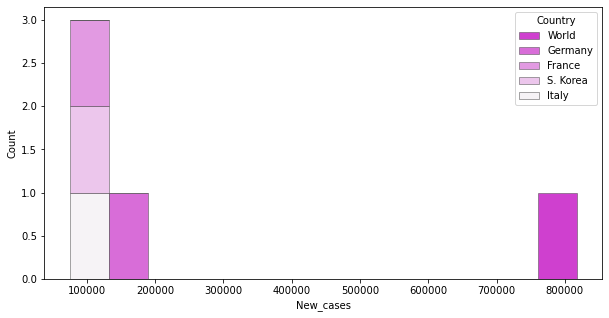

In [137]:
data_hist=df.nlargest(5, 'New_cases')
plt.figure(figsize=(10,5))
sns.histplot(
    data_hist,
    x="New_cases", hue="Country",
    multiple="stack",
    palette="light:m_r",
    edgecolor=".3",
    linewidth=.5
   # bins=30,
    #log_scale=True,
)

In [138]:
df_cases1=continet_df.groupby(continet_df['Continent'])['Active_cases'].sum()
df_cases1=pd.DataFrame(df_cases1)
df_cases1

,Active_cases
Continent,
Africa,482805
Asia,3361863
Australia/Oceania,438054
Europe,12125723
North America,2474928
South America,643001


<Figure size 720x360 with 0 Axes>

<AxesSubplot:xlabel='Active_cases', ylabel='Count'>

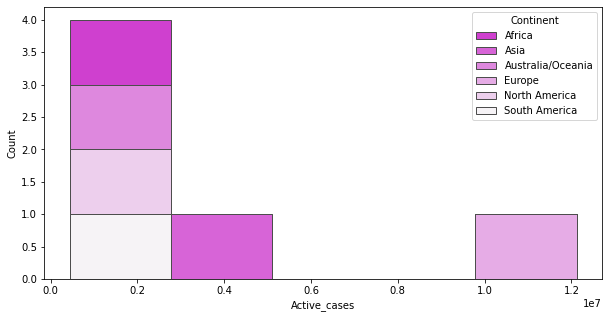

In [139]:
plt.figure(figsize=(10,5))
sns.histplot(
    df_cases1,
    x="Active_cases", hue="Continent",
    multiple="stack",
    palette="light:m_r",
    edgecolor=".3",
    linewidth=1
   # bins=30,
    #log_scale=True,
)

In [140]:
df_cases2=continet_df.groupby(continet_df['Continent'])['Total_cases/1M'].sum()
df_cases2=pd.DataFrame(df_cases2)
df_cases2

,Total_cases/1M
Continent,
Africa,1841633
Asia,5196620
Australia/Oceania,1646395
Europe,15020358
North America,6607957
South America,1735462


In [141]:
continet_df
df_cases3=continet_df.groupby(continet_df['Continent'])['New_cases'].sum()
df_cases3=pd.DataFrame(df_cases2)
df_cases3


,Continent,Unnamed: 0,Total_cases,New_cases,Total_deaths,New_deaths,Total_recovered,New_recovered,Active_cases,Serious/critical,Total_cases/1M,Deaths/1M,Total_tests,Tests/1M,Population,%Inc_cases,%Inc_deaths,%Inc_recovered
0,Africa,7831,11854737,5249,253661,71,10009500,2621,482805,957,1841633,17918,100897809,10485576,1397705453,1.552245,1.212740,2.074398
1,Asia,3314,146246781,199633,1413175,577,123628243,218057,3361863,13232,5196620,31231,1924928353,80511564,3220430952,11.636606,2.175252,7.231342
2,Australia/Oceania,2707,6713801,65199,10160,69,6193614,64751,438054,183,1646395,6222,77011050,14145595,43345658,18.022339,3.739881,7.992430
3,Europe,3263,188330395,451369,1806028,1978,164393325,648312,12125723,9236,15020358,111748,2645809100,197738505,748441644,11.943944,6.525421,8.693061
4,North America,5680,97701716,69737,1455579,500,93760683,44579,2474928,7030,6607957,51022,1117617832,88182260,597417470,4.811152,1.353009,1.897112
5,South America,1076,56640443,23484,1292770,145,50527249,20335,643001,10953,1735462,31478,218660167,12563025,437156526,0.689610,0.116373,0.339828


,Total_cases/1M
Continent,
Africa,1841633
Asia,5196620
Australia/Oceania,1646395
Europe,15020358
North America,6607957
South America,1735462


In [142]:
df

,Unnamed: 0,Country,Total_cases,New_cases,Total_deaths,New_deaths,Total_recovered,New_recovered,Active_cases,Serious/critical,Total_cases/1M,Deaths/1M,Total_tests,Tests/1M,Population,Continent,%Inc_cases,%Inc_deaths,%Inc_recovered
0,0,World,507700062,817512,6236176,3348,459968341,1000840,41495545,41814,65133,800,0,0,0,All,0.161023,0.053687,0.217589
1,1,USA,82553058,45204,1017609,299,80355389,34592,1180060,1492,246798,3042,999047824,2986727,334495877,North America,0.054758,0.029383,0.043049
2,2,India,43052425,2451,522116,54,42516068,1589,14241,698,30655,372,833377052,593395,1404421106,Asia,0.005693,0.010343,0.003737
3,3,Brazil,30330629,18660,662556,86,29353398,12596,314675,8318,140890,3078,63776166,296249,215278697,South America,0.061522,0.012980,0.042912
4,4,France,28076017,104007,144799,185,25618858,148402,2312360,1677,428423,2210,266484045,4066382,65533452,Europe,0.370448,0.127763,0.579269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,214,Wallis and Futuna,454,0,7,0,438,0,9,0,41709,643,20508,1884061,10885,Australia/Oceania,0.000000,0.000000,0.000000
215,215,Montserrat,177,0,2,0,174,0,1,0,35421,400,9587,1918551,4997,North America,0.000000,0.000000,0.000000
216,216,Falkland Islands,128,0,0,0,0,0,0,0,34954,0,8632,2357182,3662,South America,0.000000,NaN,NaN
217,217,Marshall Islands,15,0,0,0,7,0,8,0,250,0,0,0,59909,Australia/Oceania,0.000000,NaN,0.000000


<Figure size 720x360 with 0 Axes>

<AxesSubplot:xlabel='New_deaths', ylabel='Count'>

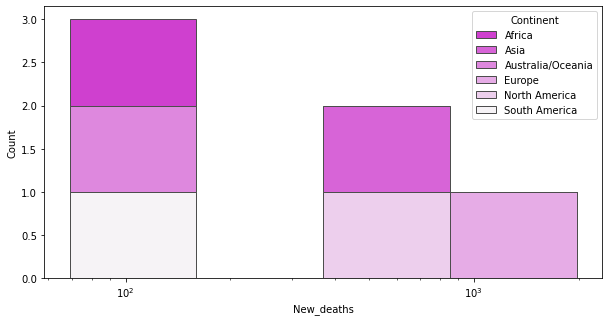

In [143]:
plt.figure(figsize=(10,5))
sns.histplot(
    continet_df,
    x="New_deaths", hue="Continent",
    multiple="stack",
    palette="light:m_r",
    edgecolor=".3",
    linewidth=1,
   # bins=30,
    log_scale=True,
)

In [144]:
df.dtypes

Unnamed: 0            int64
Country              object
Total_cases           int64
New_cases             int64
Total_deaths          int64
New_deaths            int64
Total_recovered       int64
New_recovered         int64
Active_cases          int64
Serious/critical      int64
Total_cases/1M        int64
Deaths/1M             int64
Total_tests           int64
Tests/1M              int64
Population            int64
Continent            object
%Inc_cases          float64
%Inc_deaths         float64
%Inc_recovered      float64
dtype: object

In [145]:
continet_df

,Continent,Unnamed: 0,Total_cases,New_cases,Total_deaths,New_deaths,Total_recovered,New_recovered,Active_cases,Serious/critical,Total_cases/1M,Deaths/1M,Total_tests,Tests/1M,Population,%Inc_cases,%Inc_deaths,%Inc_recovered
0,Africa,7831,11854737,5249,253661,71,10009500,2621,482805,957,1841633,17918,100897809,10485576,1397705453,1.552245,1.212740,2.074398
1,Asia,3314,146246781,199633,1413175,577,123628243,218057,3361863,13232,5196620,31231,1924928353,80511564,3220430952,11.636606,2.175252,7.231342
2,Australia/Oceania,2707,6713801,65199,10160,69,6193614,64751,438054,183,1646395,6222,77011050,14145595,43345658,18.022339,3.739881,7.992430
3,Europe,3263,188330395,451369,1806028,1978,164393325,648312,12125723,9236,15020358,111748,2645809100,197738505,748441644,11.943944,6.525421,8.693061
4,North America,5680,97701716,69737,1455579,500,93760683,44579,2474928,7030,6607957,51022,1117617832,88182260,597417470,4.811152,1.353009,1.897112
5,South America,1076,56640443,23484,1292770,145,50527249,20335,643001,10953,1735462,31478,218660167,12563025,437156526,0.689610,0.116373,0.339828


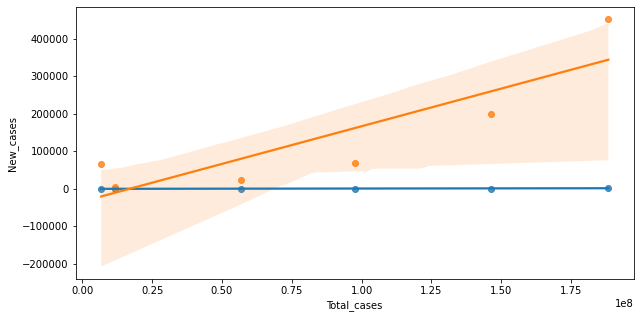

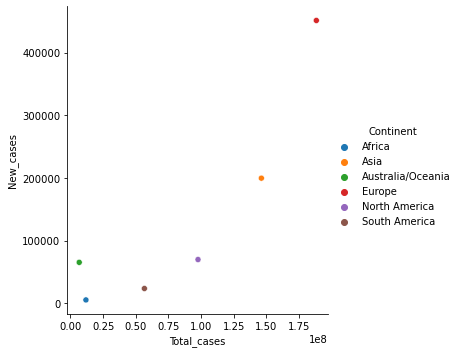

In [146]:
plt.figure(figsize=(10,5))
#fig = plt.figure(figsize=(10,6))
sns.regplot(x=continet_df["Total_cases"], y=continet_df["New_deaths"])
sns.regplot(x=continet_df["Total_cases"], y=continet_df["New_cases"])
#fig.legend(continet_df["Total_cases"],continet_df["New_cases"],continet_df["New_deaths"])
sns.relplot(x="Total_cases", y="New_cases", hue="Continent", data=continet_df);

<Figure size 720x360 with 0 Axes>

<AxesSubplot:xlabel='New_cases', ylabel='New_deaths'>

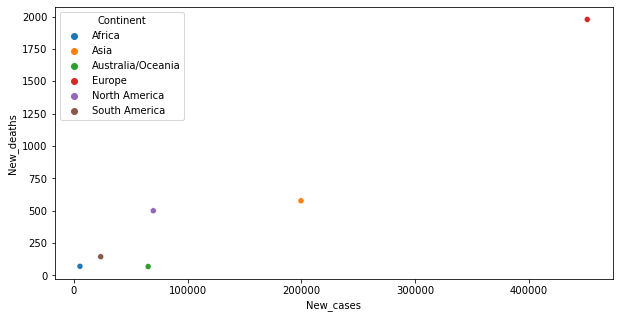

In [147]:
plt.figure(figsize=(10,5))
sns.scatterplot(data=continet_df, x="New_cases", y="New_deaths",hue='Continent')

In [148]:
df

,Unnamed: 0,Country,Total_cases,New_cases,Total_deaths,New_deaths,Total_recovered,New_recovered,Active_cases,Serious/critical,Total_cases/1M,Deaths/1M,Total_tests,Tests/1M,Population,Continent,%Inc_cases,%Inc_deaths,%Inc_recovered
0,0,World,507700062,817512,6236176,3348,459968341,1000840,41495545,41814,65133,800,0,0,0,All,0.161023,0.053687,0.217589
1,1,USA,82553058,45204,1017609,299,80355389,34592,1180060,1492,246798,3042,999047824,2986727,334495877,North America,0.054758,0.029383,0.043049
2,2,India,43052425,2451,522116,54,42516068,1589,14241,698,30655,372,833377052,593395,1404421106,Asia,0.005693,0.010343,0.003737
3,3,Brazil,30330629,18660,662556,86,29353398,12596,314675,8318,140890,3078,63776166,296249,215278697,South America,0.061522,0.012980,0.042912
4,4,France,28076017,104007,144799,185,25618858,148402,2312360,1677,428423,2210,266484045,4066382,65533452,Europe,0.370448,0.127763,0.579269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,214,Wallis and Futuna,454,0,7,0,438,0,9,0,41709,643,20508,1884061,10885,Australia/Oceania,0.000000,0.000000,0.000000
215,215,Montserrat,177,0,2,0,174,0,1,0,35421,400,9587,1918551,4997,North America,0.000000,0.000000,0.000000
216,216,Falkland Islands,128,0,0,0,0,0,0,0,34954,0,8632,2357182,3662,South America,0.000000,NaN,NaN
217,217,Marshall Islands,15,0,0,0,7,0,8,0,250,0,0,0,59909,Australia/Oceania,0.000000,NaN,0.000000


# line plot of total deaths, confirmed, recovered and active cases Country wise where deaths greater than 150

<Figure size 1080x360 with 0 Axes>

Text(0.5, 1.0, 'Total Deaths(>150), Confirmed, Recovered and Active Cases by Country')

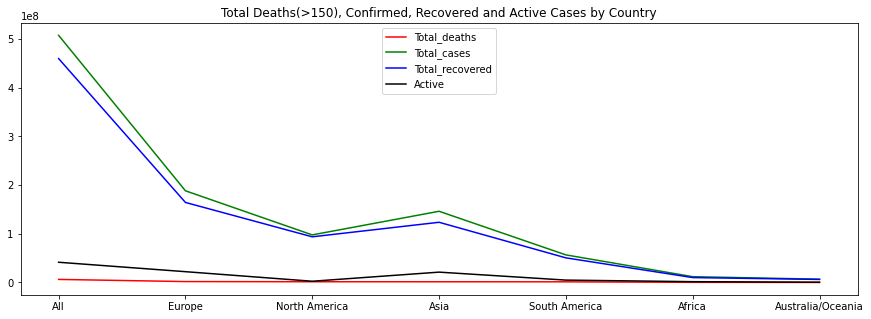

In [149]:
df['Active'] = df['Total_cases'] - df['Total_deaths'] - df['Total_recovered']
 
r_data = df.groupby(["Continent"])["Total_deaths", "Total_cases", "Total_recovered", "Active"].sum().reset_index()
r_data = r_data.sort_values(by='Total_deaths', ascending=False)
r_data = r_data[r_data['Total_deaths']>50]
plt.figure(figsize=(15, 5))
plt.plot(r_data['Continent'], r_data['Total_deaths'],color='red' ,label='Total_deaths')
plt.plot(r_data['Continent'], r_data['Total_cases'],color='green',label='Total_cases')
plt.plot(r_data['Continent'], r_data['Total_recovered'], color='blue',label='Total_recovered')
plt.plot(r_data['Continent'], r_data['Active'], color='black',label='Active')
leg = plt.legend(loc='upper center')
plt.title('Total Deaths(>150), Confirmed, Recovered and Active Cases by Country')
plt.show()

# Visualization of COVID-19 Vaccination data

# data visualization of vaccination

In [150]:
fig = px.bar(vac_df.head(20), x='location', y='total_doses',
            hover_data=['total_doses', 'fully_vaccinated'], color='location')
#fig.update_layout(template='plotly_dark')
# Alternative way for doing background dark
# fig.update_layout(plot_bgcolor = "black")
fig.update_layout(title="Top 20 Countries in view of Total Vaccinations",
                 xaxis_title= "Country Name",
                 yaxis_title= "Population",
                 template='plotly_dark')
#fig.show()

# Above graph clearly says that china is much far away then the other countries, India is progressing slowly according to it’s population while USA has achieved as much as it is rich country.

In [151]:
fig = go.Figure()
# I will skip the country China from this graph as China has not displayed their data regarding these two coulmns.
fig.add_trace(go.Bar(x=vac_df[1:20].location, y=vac_df[1:20].fully_vaccinated,
                    marker_color='crimson',
                    name='fully_vaccinated'))
fig.add_trace(go.Bar(x=vac_df[1:20].location, y=vac_df[1:20].total_doses,
                    marker_color='yellow',
                    name='total_doses'))
#fig.update_layout(template='plotly_dark')
fig.update_layout(title="Comparision between people_fully_vaccinated and people_vaccinated",
                 xaxis_title = "Country Name", yaxis_title= "Population",
                 template='plotly_dark')
#fig.show()

In [152]:
#fig = px.bar(vac_df, x = 'location',y = 'fully_vaccinated',title="Number of total vaccinations according to countries",)
#px.rotation(45)
#fig.show()

##There is a big difference in completely immunized people and partially immunized people for India,  While for United States, a little difference in both bars, they are covering there population with complete immunization along with the partial immunization

In [153]:
vac_by_location=vac_df.groupby('location').max().sort_values('total_doses',ascending=False)
vac_by_location=vac_by_location.iloc[:10]
vac_by_location

,Unnamed: 0,total_doses,New_doses_oneday,new_doses_sixtydays,fully_vaccinated,percentage
location,,,,,,
Worldwide,0,11493541038,5610182,0.0,4627183951,59.5%
China (Mainland),1,3317463000,0,0.0,1246769000,88.9%
India,2,1868475798,744947,0.0,845392713,62.1%
United States,3,570485199,19387,0.0,219047079,66.5%
Brazil,4,426002158,700965,0.0,163106069,77.2%
Indonesia,5,394736427,1487536,0.0,163036814,61.1%
Japan,6,266889958,428374,0.0,101238428,80.4%
Bangladesh,7,256016234,208075,0.0,115817367,68.8%
Pakistan,8,244920963,159016,0.0,120936554,55.2%


<Figure size 1296x432 with 0 Axes>

<BarContainer object of 10 artists>

Text(0, 0.5, 'total doses')

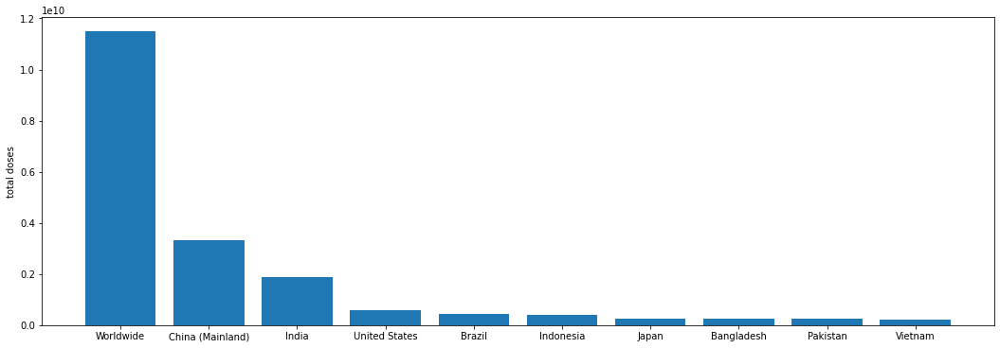

In [154]:
plt.figure(figsize=(18,6))
plt.bar(vac_by_location.index,vac_by_location.total_doses)
plt.ylabel('total doses')

In [155]:
#url2 = "https://covid.ourworldindata.org/data/internal/megafile--vaccinations-bydose.json"
#jsonData = requests.get(url2).json()

#df2 = pd.DataFrame(jsonData)
#df2

In [156]:
vac_df_data.head()

,Unnamed: 0,vacname,vacnameproduct,approved_countries,trail_count,country_trail
0,0,Nuvaxovid,Novavax,37,15,12
1,1,COVOVAX (Novavax formulation),Serum Institute of India,4,2,1
2,2,Spikevax,Moderna,85,60,22
3,3,Comirnaty,Pfizer/BioNTech,142,73,26
4,4,Ad26.COV2.S,Janssen (Johnson & Johnson),110,20,22


In [157]:
vac_df_data_1=vac_df_data[['vacnameproduct','approved_countries']]
vac_df_data_1.head()


,vacnameproduct,approved_countries
0,Novavax,37
1,Serum Institute of India,4
2,Moderna,85
3,Pfizer/BioNTech,142
4,Janssen (Johnson & Johnson),110


<Figure size 720x360 with 0 Axes>

<AxesSubplot:>

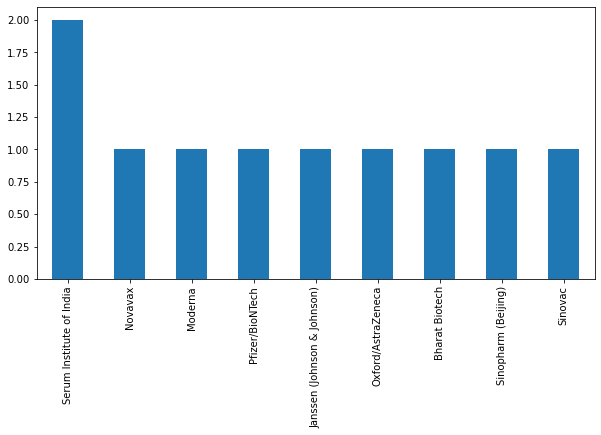

In [158]:
plt.figure(figsize=(10,5))
vac_df_data_1['vacnameproduct'].value_counts().plot(kind='bar')


# Californica Vaccination data for analysing vaccination breakthrough.

# In this we will compare no. of covid cases for vaccinated and unvaccinated people

In [159]:
vac_df_us

,Unnamed: 0,date,area,area_type,unvaccinated_cases,vaccinated_cases,boosted_cases,unvaccinated_hosp,vaccinated_hosp,boosted_hosp,...,population_boosted,unvaccinated_cases_per_100k,vaccinated_cases_per_100k,boosted_cases_per_100k,unvaccinated_hosp_per_100k,vaccinated_hosp_per_100k,boosted_hosp_per_100k,unvaccinated_deaths_per_100k,vaccinated_deaths_per_100k,boosted_deaths_per_100k
0,0.0,2021-02-01,California,State,13804,22,0,792,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0.0,2021-02-02,California,State,11352,17,0,633,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0.0,2021-02-03,California,State,10328,26,0,567,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0.0,2021-02-04,California,State,9003,17,0,498,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0.0,2021-02-05,California,State,8396,17,0,511,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
352,0.0,2022-01-19,California,State,35176,30940,12547,524,308,111,...,10681888,598,183,102,11,2,0,1,0,0
353,0.0,2022-01-20,California,State,31800,28333,11793,463,248,97,...,10835506,580,176,99,11,1,0,1,0,0
354,0.0,2022-01-21,California,State,27000,23298,10759,394,242,85,...,11014517,562,165,95,10,1,0,1,0,0
355,0.0,2022-01-22,California,State,13877,11821,6145,373,183,53,...,11109538,550,159,92,9,1,0,1,0,0


In [160]:
df_cases_us_unvac=vac_df_us.groupby(vac_df_us['area'])['unvaccinated_cases'].sum()
df_cases_us_unvac
df_cases_us_vac=vac_df_us.groupby(vac_df_us['area'])['vaccinated_cases'].sum()
df_cases_us_vac
df_cases_us_boosted=vac_df_us.groupby(vac_df_us['area'])['boosted_cases'].sum()
df_cases_us_boosted
data_us=[df_cases_us_unvac,df_cases_us_vac,df_cases_us_boosted]
#data_us
df_us=pd.DataFrame(data_us)
df_us.head()
#df_us.columns()
#df_us.rename(columns={"area": "cases", "California": "count"})



area
California    1982375
Name: unvaccinated_cases, dtype: int32

area
California    1335500
Name: vaccinated_cases, dtype: int32

area
California    322549
Name: boosted_cases, dtype: int32

area,California
unvaccinated_cases,1982375
vaccinated_cases,1335500
boosted_cases,322549


<Figure size 720x360 with 0 Axes>

<AxesSubplot:>

(array([0, 1, 2]),
 [Text(0, 0, 'unvaccinated_cases'),
  Text(1, 0, 'vaccinated_cases'),
  Text(2, 0, 'boosted_cases')])

<Figure size 720x360 with 0 Axes>

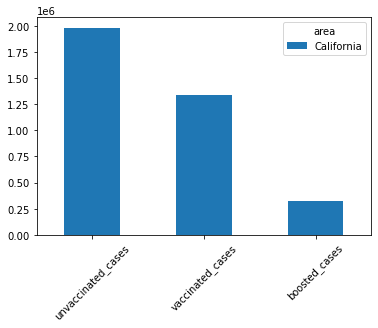

In [161]:
plt.figure(figsize=(10,5))
df_us.plot(kind='bar')
plt.xticks(rotation=45)
#figure=fig.size(10,30)

#More cases for unvaccinated people.

In [162]:
df_cases_us_unvac_hosp=vac_df_us.groupby(vac_df_us['area'])['unvaccinated_hosp'].mean()
#df_cases_us_unvac_hosp=pd.DataFrame(df_cases_us_unvac_hosp)
df_cases_us_unvac_hosp
df_cases_us_vac_hosp=vac_df_us.groupby(vac_df_us['area'])['vaccinated_hosp'].mean()
#df_cases_us_vac_hosp=pd.DataFrame(df_cases_us_vac_hosp)
df_cases_us_vac_hosp
df_cases_us_boosted_hosp=vac_df_us.groupby(vac_df_us['area'])['boosted_hosp'].mean()
df_cases_us_boosted_hosp
data_us_hosp=[df_cases_us_unvac_hosp,df_cases_us_vac_hosp,df_cases_us_boosted_hosp]
#data_us
df_us_hosp=pd.DataFrame(data_us_hosp)
df_us_hosp.head()
#result = pd.merge(df_cases_us_unvac_hosp, df_cases_us_vac_hosp,df_cases_us_boosted_hosp, on="area")
#result
#result.plot(kind='bar')
#plt.xticks(rotation=45)

area
California    272.733894
Name: unvaccinated_hosp, dtype: float64

area
California    65.07563
Name: vaccinated_hosp, dtype: float64

area
California    8.997199
Name: boosted_hosp, dtype: float64

area,California
unvaccinated_hosp,272.733894
vaccinated_hosp,65.075630
boosted_hosp,8.997199


<AxesSubplot:>

(array([0, 1, 2]),
 [Text(0, 0, 'unvaccinated_hosp'),
  Text(1, 0, 'vaccinated_hosp'),
  Text(2, 0, 'boosted_hosp')])

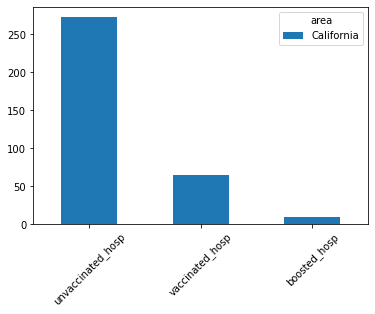

In [163]:
df_us_hosp.plot(kind='bar')
plt.xticks(rotation=45)

area
California    60
Name: unvaccinated_deaths_per_100k, dtype: int32

area
California    0
Name: vaccinated_deaths_per_100k, dtype: int32

area
California    0
Name: boosted_deaths_per_100k, dtype: int32

area,California
unvaccinated_deaths_per_100k,60
vaccinated_deaths_per_100k,0
boosted_deaths_per_100k,0


<Figure size 1080x360 with 0 Axes>

<AxesSubplot:>

(array([0, 1, 2]),
 [Text(0, 0, 'unvaccinated_deaths_per_100k'),
  Text(1, 0, 'vaccinated_deaths_per_100k'),
  Text(2, 0, 'boosted_deaths_per_100k')])

<Figure size 1080x360 with 0 Axes>

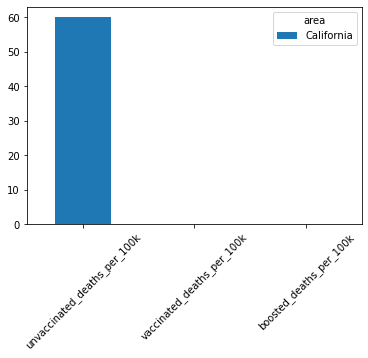

In [164]:
df_cases_us_unvac_deaths=vac_df_us.groupby(vac_df_us['area'])['unvaccinated_deaths_per_100k'].sum()
df_cases_us_unvac_deaths
df_cases_us_vac_deaths=vac_df_us.groupby(vac_df_us['area'])['vaccinated_deaths_per_100k'].sum()
df_cases_us_vac_deaths
df_cases_us_boosted_deaths=vac_df_us.groupby(vac_df_us['area'])['boosted_deaths_per_100k'].sum()
df_cases_us_boosted_deaths
data_us_deaths=[df_cases_us_unvac_deaths,df_cases_us_vac_deaths,df_cases_us_boosted_deaths]
#data_us
df_us_deaths=pd.DataFrame(data_us_deaths)
df_us_deaths.head()
#r_data = vac_df_us.groupby(["area"])["unvaccinated_deaths_per_100k", "vaccinated_deaths_per_100k", "boosted_deaths_per_100k"].sum().reset_index()
plt.figure(figsize=(15, 5))
df_us_deaths.plot(kind='bar')
plt.xticks(rotation=45)

<AxesSubplot:xlabel='vaccinated_cases', ylabel='vaccinated_hosp'>

<AxesSubplot:xlabel='vaccinated_cases', ylabel='vaccinated_deaths'>

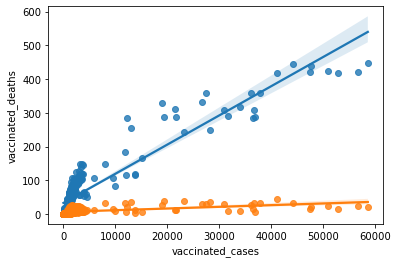

In [165]:
sns.regplot(x='vaccinated_cases', y='vaccinated_hosp', data=vac_df_us)
sns.regplot(x='vaccinated_cases', y='vaccinated_deaths', data=vac_df_us)
#sns.regplot(x='VarX', y='VarY3', data=data)

# COVID - 19 Tweets Analysis about covid vaccination

In [166]:
import snscrape.modules.twitter as sntwitter
import pandas as pd 
from tqdm import tqdm,notebook

# Creating list to append tweet data to
tweets_list2 = []
tweets_list3 = []

#p=input("Enter the tweet search")

# Using TwitterSearchScraper to scrape data and append tweets to list
for i,tweet in enumerate(sntwitter.TwitterSearchScraper('Covid-19 vaccine').get_items()):
    #print(tweet.source)
    if i>50:
        break
    tweets_list2.append([tweet.date, tweet.id, tweet.content, tweet.user.username])
    tweets_list3.append([tweet])
    
# Creating a dataframe from the tweets list above
tweets_df2 = pd.DataFrame(tweets_list2, columns=['Datetime', 'Tweet Id', 'Text', 'Username'])

tweets_df3 = pd.DataFrame(tweets_list3)



In [167]:
tweets_df2

,Datetime,Tweet Id,Text,Username
0,2022-04-22 06:46:02+00:00,1517394278200320001,"Aujourd'hui en France, on n'est à 104.007 cas ...",federicocafass7
1,2022-04-22 06:45:14+00:00,1517394079168057350,22/4/22. Suarez Castillo Milena et al. Vaccine...,aew1aew1
2,2022-04-22 06:44:41+00:00,1517393937668919302,"In 2019, @JapaninKenya also donated 12 ultra-l...",UNICEFKenya
3,2022-04-22 06:44:32+00:00,1517393899345559552,"@UKHSA @sajidjavid why have you removed ""Unadj...",hicksyalex
4,2022-04-22 06:43:42+00:00,1517393692528545794,Hailed Cambodia's purposive leadership in ASEA...,DeepThanki_BJP
5,2022-04-22 06:43:29+00:00,1517393638803705861,@kdlaw The cool inventor of the so-called COVI...,TempleOfTheDog5
6,2022-04-22 06:43:04+00:00,1517393530901401601,Hailed Cambodia's purposive leadership in ASEA...,ombirlakota
7,2022-04-22 06:42:34+00:00,1517393407022301184,@kdlaw AFLD and its members have put their liv...,TempleOfTheDog5
8,2022-04-22 06:42:00+00:00,1517393262688206849,With reduced restrictions its good to see @Aus...,Jon_corfield
9,2022-04-22 06:38:20+00:00,1517392340914098176,@ChiRealDeal I don't think it's about hating a...,armando7usa


In [168]:
tweets_copy = []
for tweet in tqdm(tweets_list3):
     tweets_copy.append(tweet)

100%|██████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<?, ?it/s]


In [169]:
tweets_copy

[[Tweet(url='https://twitter.com/federicocafass7/status/1517394278200320001', date=datetime.datetime(2022, 4, 22, 6, 46, 2, tzinfo=datetime.timezone.utc), content="Aujourd'hui en France, on n'est à 104.007 cas de Covid-19 alors que hier on n'était à 19.000 cas ça fait plus d'un mois que le masque n'est plus obligatoire mais les gens quand ils vont se prendre le covid 19 même si t'es vacciné les gens vont respecter", renderedContent="Aujourd'hui en France, on n'est à 104.007 cas de Covid-19 alors que hier on n'était à 19.000 cas ça fait plus d'un mois que le masque n'est plus obligatoire mais les gens quand ils vont se prendre le covid 19 même si t'es vacciné les gens vont respecter", id=1517394278200320001, user=User(username='federicocafass7', id=796681178208157696, displayname='federico cafasso', description="J'aime la musculation, musique, sortir en vélo ou en trottinette, j'aime beaucoup les jeux vidéos, mon Twitch c'est crepiere0, mon compte tik tok c'est@federico", rawDescription

In [170]:
#tweets_df = pd.DataFrame()
#for tweet in tqdm(tweets_copy):
   # print(tweet)
    #hashtags = []
   # try:
      #  for hashtag in tweet.entities["hashtags"]:
        #    hashtags.append(hashtag["text"])
       # text = api.get_status(id=tweet.id, tweet_mode='extended').full_text
       # print(text)
   # except:
       # pass
   # tweets_df = tweets_df.append(pd.DataFrame({#'user_name': tweet.username, 
                                               #'user_location': tweet.location,
                                               #'user_description': tweet.User.description,
                                               #'user_created': tweet.user.created_at,
                                               #'user_followers': tweet.user.followers_count,
                                               #'user_friends': tweet.user.friends_count,
                                               #'user_favourites': tweet.user.favourites_count,
                                               #'user_verified': tweet.user.verified,
                                              # 'date': tweet.created_at,
                                              # 'text': tweet.content, 
                                              # 'hashtags': [hashtags if hashtags else None],
                                              # 'source': tweet.source,
                                              # 'is_retweet': tweet.retweeted}, index=[0]))

In [171]:
tweets_df2

,Datetime,Tweet Id,Text,Username
0,2022-04-22 06:46:02+00:00,1517394278200320001,"Aujourd'hui en France, on n'est à 104.007 cas ...",federicocafass7
1,2022-04-22 06:45:14+00:00,1517394079168057350,22/4/22. Suarez Castillo Milena et al. Vaccine...,aew1aew1
2,2022-04-22 06:44:41+00:00,1517393937668919302,"In 2019, @JapaninKenya also donated 12 ultra-l...",UNICEFKenya
3,2022-04-22 06:44:32+00:00,1517393899345559552,"@UKHSA @sajidjavid why have you removed ""Unadj...",hicksyalex
4,2022-04-22 06:43:42+00:00,1517393692528545794,Hailed Cambodia's purposive leadership in ASEA...,DeepThanki_BJP
5,2022-04-22 06:43:29+00:00,1517393638803705861,@kdlaw The cool inventor of the so-called COVI...,TempleOfTheDog5
6,2022-04-22 06:43:04+00:00,1517393530901401601,Hailed Cambodia's purposive leadership in ASEA...,ombirlakota
7,2022-04-22 06:42:34+00:00,1517393407022301184,@kdlaw AFLD and its members have put their liv...,TempleOfTheDog5
8,2022-04-22 06:42:00+00:00,1517393262688206849,With reduced restrictions its good to see @Aus...,Jon_corfield
9,2022-04-22 06:38:20+00:00,1517392340914098176,@ChiRealDeal I don't think it's about hating a...,armando7usa


In [172]:
#df_tw=pd.read_csv('https://raw.githubusercontent.com/gabrielpreda/covid-19-tweets/master/covid19_tweets.csv')
#df_tw.head()


In [173]:
tweets_df2.dtypes

Datetime    datetime64[ns, UTC]
Tweet Id                  int64
Text                     object
Username                 object
dtype: object

In [174]:
#df_tw.dtypes

In [175]:
#df_tw['source'].unique()

In [176]:
#tweets_df2['source'].unique()

In [177]:
#df_tw['source'].value_counts().nlargest(30)

# Data Cleaning for Twitter Data

In [178]:
!pip install neattext

You should consider upgrading via the 'C:\Users\mrjdh\anaconda3\python.exe -m pip install --upgrade pip' command.


In [179]:
#for data cleaning
import neattext.functions as nfx

In [180]:
#df_tw['text']
tweets_df2['Text']

0     Aujourd'hui en France, on n'est à 104.007 cas ...
1     22/4/22. Suarez Castillo Milena et al. Vaccine...
2     In 2019, @JapaninKenya also donated 12 ultra-l...
3     @UKHSA @sajidjavid why have you removed "Unadj...
4     Hailed Cambodia's purposive leadership in ASEA...
5     @kdlaw The cool inventor of the so-called COVI...
6     Hailed Cambodia's purposive leadership in ASEA...
7     @kdlaw AFLD and its members have put their liv...
8     With reduced restrictions its good to see @Aus...
9     @ChiRealDeal I don't think it's about hating a...
10    The most recent data released by the Ontario g...
11    How effective are Covid-19 vaccines for people...
12    bharat biotech: Bharat Biotech asked to provid...
13    NOW: Department of Health Undersecretary, 𝙈𝙖𝙧𝙞...
14    Après plus de deux années de pandémie, un cert...
15    दिल्ली में 18+ लोगों को मुफ्त लगेगी कोरोना वैक...
16    DCGI ने भारत बायोटेक से बच्चों के लिए अपने COV...
17    🔹India’s Cumulative COVID-19 Vaccination C

In [181]:
#df_tw.head()
tweets_df2.head()

,Datetime,Tweet Id,Text,Username
0,2022-04-22 06:46:02+00:00,1517394278200320001,"Aujourd'hui en France, on n'est à 104.007 cas ...",federicocafass7
1,2022-04-22 06:45:14+00:00,1517394079168057350,22/4/22. Suarez Castillo Milena et al. Vaccine...,aew1aew1
2,2022-04-22 06:44:41+00:00,1517393937668919302,"In 2019, @JapaninKenya also donated 12 ultra-l...",UNICEFKenya
3,2022-04-22 06:44:32+00:00,1517393899345559552,"@UKHSA @sajidjavid why have you removed ""Unadj...",hicksyalex
4,2022-04-22 06:43:42+00:00,1517393692528545794,Hailed Cambodia's purposive leadership in ASEA...,DeepThanki_BJP


# Data Cleaning

In [182]:
#df_tw['extracted_hashtags']=df_tw['text'].apply(nfx.extract_hashtags)

In [183]:
#df_tw.head()

In [184]:
#df_tw['clean_tweet']=df_tw['text'].apply(nfx.remove_hashtags)
#df_tw[['clean_tweet','text']]

In [185]:
dir(nfx)

['BTC_ADDRESS_REGEX',
 'CURRENCY_REGEX',
 'CURRENCY_SYMB_REGEX',
 'Counter',
 'DATE_REGEX',
 'EMAIL_REGEX',
 'EMOJI_REGEX',
 'HASTAG_REGEX',
 'MASTERCard_REGEX',
 'MD5_SHA_REGEX',
 'MOST_COMMON_PUNCT_REGEX',
 'NUMBERS_REGEX',
 'PHONE_REGEX',
 'PoBOX_REGEX',
 'SPECIAL_CHARACTERS_REGEX',
 'STOPWORDS',
 'STOPWORDS_de',
 'STOPWORDS_en',
 'STOPWORDS_es',
 'STOPWORDS_fr',
 'STOPWORDS_ru',
 'STOPWORDS_yo',
 'STREET_ADDRESS_REGEX',
 'TextFrame',
 'URL_PATTERN',
 'USER_HANDLES_REGEX',
 'VISACard_REGEX',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__generate_text',
 '__loader__',
 '__name__',
 '__numbers_dict',
 '__package__',
 '__spec__',
 '_lex_richness_herdan',
 '_lex_richness_maas_ttr',
 'clean_text',
 'defaultdict',
 'digit2words',
 'extract_btc_address',
 'extract_currencies',
 'extract_currency_symbols',
 'extract_dates',
 'extract_emails',
 'extract_emojis',
 'extract_hashtags',
 'extract_html_tags',
 'extract_mastercard_addr',
 'extract_md5sha',
 'extract_numbers',
 'extr

In [186]:
#df_tw['clean_tweet']=df_tw['clean_tweet'].apply(lambda x: nfx.remove_userhandles(x))

In [187]:
tweets_df2['Text']=tweets_df2['Text'].apply(lambda x: nfx.remove_userhandles(x))

In [188]:
tweets_df2['Text']

0     Aujourd'hui en France, on n'est à 104.007 cas ...
1     22/4/22. Suarez Castillo Milena et al. Vaccine...
2     In 2019,   also donated 12 ultra-low temperatu...
3         why have you removed "Unadjusted rates of ...
4     Hailed Cambodia's purposive leadership in ASEA...
5       The cool inventor of the so-called COVID-19 ...
6     Hailed Cambodia's purposive leadership in ASEA...
7       AFLD and its members have put their liveliho...
8     With reduced restrictions its good to see   st...
9       I don't think it's about hating anyone. Mexi...
10    The most recent data released by the Ontario g...
11    How effective are Covid-19 vaccines for people...
12    bharat biotech: Bharat Biotech asked to provid...
13    NOW: Department of Health Undersecretary, 𝙈𝙖𝙧𝙞...
14    Après plus de deux années de pandémie, un cert...
15    दिल्ली में 18+ लोगों को मुफ्त लगेगी कोरोना वैक...
16    DCGI ने भारत बायोटेक से बच्चों के लिए अपने COV...
17    🔹India’s Cumulative COVID-19 Vaccination C

In [189]:
#df_tw['clean_tweet']=df_tw['clean_tweet'].apply(lambda x: nfx.remove_multiple_spaces(x))
tweets_df2['Text']=tweets_df2['Text'].apply(lambda x: nfx.remove_multiple_spaces(x))

In [190]:
tweets_df2['Text']

0     Aujourd'hui en France, on n'est à 104.007 cas ...
1     22/4/22. Suarez Castillo Milena et al. Vaccine...
2     In 2019, also donated 12 ultra-low temperature...
3      why have you removed "Unadjusted rates of COV...
4     Hailed Cambodia's purposive leadership in ASEA...
5      The cool inventor of the so-called COVID-19 v...
6     Hailed Cambodia's purposive leadership in ASEA...
7      AFLD and its members have put their livelihoo...
8     With reduced restrictions its good to see stag...
9      I don't think it's about hating anyone. Mexic...
10    The most recent data released by the Ontario g...
11    How effective are Covid-19 vaccines for people...
12    bharat biotech: Bharat Biotech asked to provid...
13    NOW: Department of Health Undersecretary, 𝙈𝙖𝙧𝙞...
14    Après plus de deux années de pandémie, un cert...
15    दिल्ली में 18+ लोगों को मुफ्त लगेगी कोरोना वैक...
16    DCGI ने भारत बायोटेक से बच्चों के लिए अपने COV...
17    🔹India’s Cumulative COVID-19 Vaccination C

In [191]:
#df_tw['clean_tweet'].iloc[20]
tweets_df2['Text'].iloc[20]

'📍Update on COVID-19 Vaccine Availability in States/UTs 💠More than 192.40 Crore vaccine doses provided to States/UTs 💠More than 20.10 Crore balance and unutilized vaccine doses still available with States/UTs Details: https://t.co/n94NLdGuXI #IndiaFightsCorona https://t.co/ACR6HJHkxk'

In [192]:
#df_tw['clean_tweet']=df_tw['clean_tweet'].apply(lambda x:re.sub(r"\S*https?:\S*", "", str(x)))#sub(r"https://t.co/""*","",str(x))
#df_tw['clean_tweet']
tweets_df2['Text']=tweets_df2['Text'].apply(lambda x:re.sub(r"\S*https?:\S*", "", str(x)))#sub(r"https://t.co/""*","",str(x))
tweets_df2['Text']

0     Aujourd'hui en France, on n'est à 104.007 cas ...
1     22/4/22. Suarez Castillo Milena et al. Vaccine...
2     In 2019, also donated 12 ultra-low temperature...
3      why have you removed "Unadjusted rates of COV...
4     Hailed Cambodia's purposive leadership in ASEA...
5      The cool inventor of the so-called COVID-19 v...
6     Hailed Cambodia's purposive leadership in ASEA...
7      AFLD and its members have put their livelihoo...
8     With reduced restrictions its good to see stag...
9      I don't think it's about hating anyone. Mexic...
10    The most recent data released by the Ontario g...
11    How effective are Covid-19 vaccines for people...
12    bharat biotech: Bharat Biotech asked to provid...
13    NOW: Department of Health Undersecretary, 𝙈𝙖𝙧𝙞...
14    Après plus de deux années de pandémie, un cert...
15    दिल्ली में 18+ लोगों को मुफ्त लगेगी कोरोना वैक...
16    DCGI ने भारत बायोटेक से बच्चों के लिए अपने COV...
17    🔹India’s Cumulative COVID-19 Vaccination C

In [193]:
tweets_df2['Text']=tweets_df2['Text'].apply(nfx.remove_puncts)

In [194]:
tweets_df2['Text']

0     Aujourdhui en France on nest à 104007 cas de C...
1     22/4/22 Suarez Castillo Milena et al Vaccinein...
2     In 2019 also donated 12 ultralow temperature f...
3      why have you removed Unadjusted rates of COVI...
4     Hailed Cambodias purposive leadership in ASEAN...
5      The cool inventor of the socalled COVID19 vac...
6     Hailed Cambodias purposive leadership in ASEAN...
7      AFLD and its members have put their livelihoo...
8     With reduced restrictions its good to see stag...
9      I dont think its about hating anyone Mexico f...
10    The most recent data released by the Ontario g...
11    How effective are Covid19 vaccines for people ...
12    bharat biotech: Bharat Biotech asked to provid...
13    NOW: Department of Health Undersecretary 𝙈𝙖𝙧𝙞𝙖...
14    Après plus de deux années de pandémie un certa...
15    दिल्ली में 18+ लोगों को मुफ्त लगेगी कोरोना वैक...
16    DCGI ने भारत बायोटेक से बच्चों के लिए अपने COV...
17    🔹India’s Cumulative COVID19 Vaccination Co

In [195]:
#req_col=['user_name','date','text','clean_tweet','source']
#df_tw=df_tw[req_col]
#df_tw.head()
tweets_df2.head()
tweets_df2['Text']

,Datetime,Tweet Id,Text,Username
0,2022-04-22 06:46:02+00:00,1517394278200320001,Aujourdhui en France on nest à 104007 cas de C...,federicocafass7
1,2022-04-22 06:45:14+00:00,1517394079168057350,22/4/22 Suarez Castillo Milena et al Vaccinein...,aew1aew1
2,2022-04-22 06:44:41+00:00,1517393937668919302,In 2019 also donated 12 ultralow temperature f...,UNICEFKenya
3,2022-04-22 06:44:32+00:00,1517393899345559552,why have you removed Unadjusted rates of COVI...,hicksyalex
4,2022-04-22 06:43:42+00:00,1517393692528545794,Hailed Cambodias purposive leadership in ASEAN...,DeepThanki_BJP


0     Aujourdhui en France on nest à 104007 cas de C...
1     22/4/22 Suarez Castillo Milena et al Vaccinein...
2     In 2019 also donated 12 ultralow temperature f...
3      why have you removed Unadjusted rates of COVI...
4     Hailed Cambodias purposive leadership in ASEAN...
5      The cool inventor of the socalled COVID19 vac...
6     Hailed Cambodias purposive leadership in ASEAN...
7      AFLD and its members have put their livelihoo...
8     With reduced restrictions its good to see stag...
9      I dont think its about hating anyone Mexico f...
10    The most recent data released by the Ontario g...
11    How effective are Covid19 vaccines for people ...
12    bharat biotech: Bharat Biotech asked to provid...
13    NOW: Department of Health Undersecretary 𝙈𝙖𝙧𝙞𝙖...
14    Après plus de deux années de pandémie un certa...
15    दिल्ली में 18+ लोगों को मुफ्त लगेगी कोरोना वैक...
16    DCGI ने भारत बायोटेक से बच्चों के लिए अपने COV...
17    🔹India’s Cumulative COVID19 Vaccination Co

In [196]:
! pip install -U textblob
! python -m textblob.download_corpora

You should consider upgrading via the 'C:\Users\mrjdh\anaconda3\python.exe -m pip install --upgrade pip' command.


Finished.


[nltk_data] Downloading package brown to
[nltk_data]     C:\Users\mrjdh\AppData\Roaming\nltk_data...
[nltk_data]   Package brown is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\mrjdh\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\mrjdh\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\mrjdh\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package conll2000 to
[nltk_data]     C:\Users\mrjdh\AppData\Roaming\nltk_data...
[nltk_data]   Package conll2000 is already up-to-date!
[nltk_data] Downloading package movie_reviews to
[nltk_data]     C:\Users\mrjdh\AppData\Roaming\nltk_data...
[nltk_data]   Package movie_reviews is already up-to-date!

In [197]:
from textblob import TextBlob


In [198]:
def get_sentiment(text):
    blob=TextBlob(text)
    sentiment_polarity=blob.sentiment.polarity
    sentiment_subjectivity=blob.sentiment.subjectivity
    if sentiment_polarity>0:
        sentiment_label='Positive'
    elif sentiment_polarity<0:
        sentiment_label='Negative'
    else :
        sentiment_label='Neutral'
    result={'polarity':sentiment_polarity,'subjectivity':sentiment_subjectivity,'sentiment':sentiment_label}
    return result
    
    

In [199]:
#x1=df_tw['clean_tweet'].iloc[0]
#get_sentiment(x1)

In [200]:
x2=tweets_df2['Text'].iloc[0]
get_sentiment(x2)

{'polarity': 0.0, 'subjectivity': 0.0, 'sentiment': 'Neutral'}

In [201]:
#df_tw['sentiment_results']=df_tw['clean_tweet'].apply(get_sentiment)

In [202]:
tweets_df2['sen_results']=tweets_df2['Text'].apply(get_sentiment)

In [203]:
tweets_df2['sen_results']

0     {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
1     {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
2     {'polarity': -0.125, 'subjectivity': 0.375, 's...
3     {'polarity': -0.5, 'subjectivity': 0.5, 'senti...
4     {'polarity': 0.1875, 'subjectivity': 0.4375, '...
5     {'polarity': 0.175, 'subjectivity': 0.325, 'se...
6     {'polarity': 0.1875, 'subjectivity': 0.4375, '...
7     {'polarity': 0.175, 'subjectivity': 0.36666666...
8     {'polarity': 0.6, 'subjectivity': 0.55, 'senti...
9     {'polarity': 0.125, 'subjectivity': 0.16666666...
10    {'polarity': 0.25, 'subjectivity': 0.5625, 'se...
11    {'polarity': 0.6, 'subjectivity': 0.8, 'sentim...
12    {'polarity': 0.2, 'subjectivity': 0.45, 'senti...
13    {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
14    {'polarity': 0.21428571428571427, 'subjectivit...
15    {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
16    {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
17    {'polarity': 0.0, 'subjectivity': 0.4, 'se

In [204]:
#df_tw['sentiment_results']

In [205]:
#df_tw=df_tw.join(pd.json_normalize(df_tw['sentiment_results']))

In [206]:
tweets_df2=tweets_df2.join(pd.json_normalize(tweets_df2['sen_results']))

In [207]:
tweets_df2.head()

,Datetime,Tweet Id,Text,Username,sen_results,polarity,subjectivity,sentiment
0,2022-04-22 06:46:02+00:00,1517394278200320001,Aujourdhui en France on nest à 104007 cas de C...,federicocafass7,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0000,0.0000,Neutral
1,2022-04-22 06:45:14+00:00,1517394079168057350,22/4/22 Suarez Castillo Milena et al Vaccinein...,aew1aew1,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0000,0.0000,Neutral
2,2022-04-22 06:44:41+00:00,1517393937668919302,In 2019 also donated 12 ultralow temperature f...,UNICEFKenya,"{'polarity': -0.125, 'subjectivity': 0.375, 's...",-0.1250,0.3750,Negative
3,2022-04-22 06:44:32+00:00,1517393899345559552,why have you removed Unadjusted rates of COVI...,hicksyalex,"{'polarity': -0.5, 'subjectivity': 0.5, 'senti...",-0.5000,0.5000,Negative
4,2022-04-22 06:43:42+00:00,1517393692528545794,Hailed Cambodias purposive leadership in ASEAN...,DeepThanki_BJP,"{'polarity': 0.1875, 'subjectivity': 0.4375, '...",0.1875,0.4375,Positive


In [208]:
#df_tw.head()

In [209]:
tweets_df2

,Datetime,Tweet Id,Text,Username,sen_results,polarity,subjectivity,sentiment
0,2022-04-22 06:46:02+00:00,1517394278200320001,Aujourdhui en France on nest à 104007 cas de C...,federicocafass7,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.000000,0.000000,Neutral
1,2022-04-22 06:45:14+00:00,1517394079168057350,22/4/22 Suarez Castillo Milena et al Vaccinein...,aew1aew1,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.000000,0.000000,Neutral
2,2022-04-22 06:44:41+00:00,1517393937668919302,In 2019 also donated 12 ultralow temperature f...,UNICEFKenya,"{'polarity': -0.125, 'subjectivity': 0.375, 's...",-0.125000,0.375000,Negative
3,2022-04-22 06:44:32+00:00,1517393899345559552,why have you removed Unadjusted rates of COVI...,hicksyalex,"{'polarity': -0.5, 'subjectivity': 0.5, 'senti...",-0.500000,0.500000,Negative
4,2022-04-22 06:43:42+00:00,1517393692528545794,Hailed Cambodias purposive leadership in ASEAN...,DeepThanki_BJP,"{'polarity': 0.1875, 'subjectivity': 0.4375, '...",0.187500,0.437500,Positive
5,2022-04-22 06:43:29+00:00,1517393638803705861,The cool inventor of the socalled COVID19 vac...,TempleOfTheDog5,"{'polarity': 0.175, 'subjectivity': 0.325, 'se...",0.175000,0.325000,Positive
6,2022-04-22 06:43:04+00:00,1517393530901401601,Hailed Cambodias purposive leadership in ASEAN...,ombirlakota,"{'polarity': 0.1875, 'subjectivity': 0.4375, '...",0.187500,0.437500,Positive
7,2022-04-22 06:42:34+00:00,1517393407022301184,AFLD and its members have put their livelihoo...,TempleOfTheDog5,"{'polarity': 0.175, 'subjectivity': 0.36666666...",0.175000,0.366667,Positive
8,2022-04-22 06:42:00+00:00,1517393262688206849,With reduced restrictions its good to see stag...,Jon_corfield,"{'polarity': 0.6, 'subjectivity': 0.55, 'senti...",0.600000,0.550000,Positive
9,2022-04-22 06:38:20+00:00,1517392340914098176,I dont think its about hating anyone Mexico f...,armando7usa,"{'polarity': 0.125, 'subjectivity': 0.16666666...",0.125000,0.166667,Positive


In [210]:
positive_tweet1=tweets_df2[tweets_df2['sentiment']=='Positive']['Text']
negative_tweet1=tweets_df2[tweets_df2['sentiment']=='Negative']['Text']
neutral_tweet1=tweets_df2[tweets_df2['sentiment']=='Neutral']['Text']

In [211]:
#positive_tweet=df_tw[df_tw['sentiment']=='Positive']['clean_tweet']
#negative_tweet=df_tw[df_tw['sentiment']=='Negative']['clean_tweet']
#neutral_tweet=df_tw[df_tw['sentiment']=='Neutral']['clean_tweet']

In [212]:
negative_tweet1

2     In 2019 also donated 12 ultralow temperature f...
3      why have you removed Unadjusted rates of COVI...
23     Coronaviruses existed before Covid 19 Its pre...
25     ⭕️ “Apparent”…\n“It did however say that othe...
27    Quad countries have so far provided Thailand f...
28    How do the PfizerBioNTech and Johnson amp John...
29    Subject Expert Committee of #DCGI has asked #B...
31    Vaccines dont protect you from getting it Sorr...
32    at least this is clear:  no link to the Covid1...
33    As reported by Maryanne Demasi PhD in the Brit...
45    Former Mp for Ledzokuku appointed as acting CE...
49     Im not against vaccination because vaccines i...
Name: Text, dtype: object

In [213]:
positive_tweet1

4     Hailed Cambodias purposive leadership in ASEAN...
5      The cool inventor of the socalled COVID19 vac...
6     Hailed Cambodias purposive leadership in ASEAN...
7      AFLD and its members have put their livelihoo...
8     With reduced restrictions its good to see stag...
9      I dont think its about hating anyone Mexico f...
10    The most recent data released by the Ontario g...
11    How effective are Covid19 vaccines for people ...
12    bharat biotech: Bharat Biotech asked to provid...
14    Après plus de deux années de pandémie un certa...
18    \nVAERS data: Found 1226314 cases where Vaccin...
20    📍Update on COVID19 Vaccine Availability in Sta...
22    Moderna Covid 19 vaccine now available at Deso...
24    AstraZenica CEO December 2020\nImmunocompromis...
34    four and a half million Covid19 vaccine doses ...
35    USA: The Illinois Appellate Court on Thursday ...
36    Around 5000 people in the age group of 18 to 5...
37    on April 12 PrimeMinister Narendra Modi ha

In [214]:
#positive_tweet_list=positive_tweet.apply(nfx.remove_stopwords).tolist()
#negative_tweet_list=negative_tweet.apply(nfx.remove_stopwords).tolist()
#neutral_tweet_list=neutral_tweet.apply(nfx.remove_stopwords).tolist()

In [215]:
positive_tweet_list1=positive_tweet1.apply(nfx.remove_stopwords).tolist()
negative_tweet_list1=negative_tweet1.apply(nfx.remove_stopwords).tolist()
neutral_tweet_list1=neutral_tweet1.apply(nfx.remove_stopwords).tolist()

In [216]:
#positive_tweet_list
negative_tweet_list1

['2019 donated 12 ultralow temperature freezers accessories storage COVID19 vaccines 2013 Kitengela National Vaccine Depot 3 regional vaccine depots constructed grant JICA',
 'removed Unadjusted rates COVID19 infection hospitalisation death 💉 amp unvaccinated populations Vaccine Surveillance Report Whilst vaguely understand impact reduced testing cases affect 🏥 ⚰️',
 'Coronaviruses existed Covid 19 pretty common knowledge researching developing vaccines decades',
 '⭕️ “Apparent”… “It possible causes illness investigated ruled Covid19 added apparent link Covid19 vaccines”',
 'Quad countries far provided Thailand half million Covid19 vaccine doses Quad countries provided mile delivery assistance monetary support ensure vaccines translated vaccinations',
 'PfizerBioNTech Johnson amp Johnson COVID19 vaccines work protect COVID19 illness death',
 'Subject Expert Committee #DCGI asked #Bharat #Biotech additional data COVID19 vaccine #Covaxin administering children aged 212 years #COVID19Indi

In [217]:
positive_tweet_list1

['Hailed Cambodias purposive leadership ASEAN Cambodia expressed gratitude India giving vaccines fight COVID19 Emphasized enhancing trade ties greater cooperation health textile sectors',
 'cool inventor socalled COVID19 vaccine Dr Robert Malone Look invention Kristina lady zero medical background Miss Lawson dont tell background',
 'Hailed Cambodias purposive leadership ASEAN Cambodia expressed gratitude India giving vaccines fight COVID19 Emphasized enhancing trade ties greater cooperation health textile sectors',
 'AFLD members livelihood safety line truth socalled COVID19 vaccine vaccine experimental RNA gene therapy',
 'reduced restrictions good staged rollout covid19 going better rollout vaccine',
 'dont think hating Mexico purchased initial COVID19 vaccine Russia didnt work purchased Pfizer vaccine citizens Mexico nonaligned country said wouldnt know',
 'recent data released Ontario government shows received doses COVID vaccine times likely infected COVID19',
 'effective Covid19

In [218]:
#df_tw.user_name=df_tw.user_name.astype('category')
#df_tw.user_name=df_tw.user_name.cat.codes.astype(str)

#df_tw.date=pd.to_datetime(df_tw.date).dt.date
#df_tw.head()


In [219]:
#text_en_lr_lc=text_en_lr.apply(lambda x: x.lower())
#text_en_lr_lc.head()

In [220]:
#text_en_lr_lc_pr=text_en_lr.apply(lambda x: x.translate(string.maketrans('',''),string.punctuation))
#text_en_lr_lc_pr.head()

In [221]:
#word_list=[word for line in text_en_lr_lc for word in line.split()]
#word_list[:5]

In [222]:
pos_tokens=[token for line in positive_tweet_list1 for token in line.split()]
neg_tokens=[token for line in negative_tweet_list1 for token in line.split()]
neu_tokens=[token for line in neutral_tweet_list1 for token in line.split()]

In [223]:
pos_tokens
neg_tokens
neu_tokens

['Hailed',
 'Cambodias',
 'purposive',
 'leadership',
 'ASEAN',
 'Cambodia',
 'expressed',
 'gratitude',
 'India',
 'giving',
 'vaccines',
 'fight',
 'COVID19',
 'Emphasized',
 'enhancing',
 'trade',
 'ties',
 'greater',
 'cooperation',
 'health',
 'textile',
 'sectors',
 'cool',
 'inventor',
 'socalled',
 'COVID19',
 'vaccine',
 'Dr',
 'Robert',
 'Malone',
 'Look',
 'invention',
 'Kristina',
 'lady',
 'zero',
 'medical',
 'background',
 'Miss',
 'Lawson',
 'dont',
 'tell',
 'background',
 'Hailed',
 'Cambodias',
 'purposive',
 'leadership',
 'ASEAN',
 'Cambodia',
 'expressed',
 'gratitude',
 'India',
 'giving',
 'vaccines',
 'fight',
 'COVID19',
 'Emphasized',
 'enhancing',
 'trade',
 'ties',
 'greater',
 'cooperation',
 'health',
 'textile',
 'sectors',
 'AFLD',
 'members',
 'livelihood',
 'safety',
 'line',
 'truth',
 'socalled',
 'COVID19',
 'vaccine',
 'vaccine',
 'experimental',
 'RNA',
 'gene',
 'therapy',
 'reduced',
 'restrictions',
 'good',
 'staged',
 'rollout',
 'covid19',


['2019',
 'donated',
 '12',
 'ultralow',
 'temperature',
 'freezers',
 'accessories',
 'storage',
 'COVID19',
 'vaccines',
 '2013',
 'Kitengela',
 'National',
 'Vaccine',
 'Depot',
 '3',
 'regional',
 'vaccine',
 'depots',
 'constructed',
 'grant',
 'JICA',
 'removed',
 'Unadjusted',
 'rates',
 'COVID19',
 'infection',
 'hospitalisation',
 'death',
 '💉',
 'amp',
 'unvaccinated',
 'populations',
 'Vaccine',
 'Surveillance',
 'Report',
 'Whilst',
 'vaguely',
 'understand',
 'impact',
 'reduced',
 'testing',
 'cases',
 'affect',
 '🏥',
 '⚰️',
 'Coronaviruses',
 'existed',
 'Covid',
 '19',
 'pretty',
 'common',
 'knowledge',
 'researching',
 'developing',
 'vaccines',
 'decades',
 '⭕️',
 '“Apparent”…',
 '“It',
 'possible',
 'causes',
 'illness',
 'investigated',
 'ruled',
 'Covid19',
 'added',
 'apparent',
 'link',
 'Covid19',
 'vaccines”',
 'Quad',
 'countries',
 'far',
 'provided',
 'Thailand',
 'half',
 'million',
 'Covid19',
 'vaccine',
 'doses',
 'Quad',
 'countries',
 'provided',
 'mi

['Aujourdhui',
 'en',
 'France',
 'nest',
 'à',
 '104007',
 'cas',
 'de',
 'Covid19',
 'alors',
 'que',
 'hier',
 'nétait',
 'à',
 '19000',
 'cas',
 'ça',
 'fait',
 'plus',
 'dun',
 'mois',
 'que',
 'le',
 'masque',
 'nest',
 'plus',
 'obligatoire',
 'mais',
 'les',
 'gens',
 'quand',
 'ils',
 'vont',
 'se',
 'prendre',
 'le',
 'covid',
 '19',
 'même',
 'si',
 'tes',
 'vacciné',
 'les',
 'gens',
 'vont',
 'respecter',
 '22/4/22',
 'Suarez',
 'Castillo',
 'Milena',
 'et',
 'al',
 'Vaccineinduced',
 'naturallyacquired',
 'protection',
 'Omicron',
 'Delta',
 'symptomatic',
 'infection',
 'severe',
 'COVID19',
 'outcomes',
 'France',
 'December',
 '2021',
 'January',
 '2022',
 'Euro',
 'Surveill',
 '202227(16):pii=2200250',
 'NOW:',
 'Department',
 'Health',
 'Undersecretary',
 '𝙈𝙖𝙧𝙞𝙖',
 '𝙍𝙤𝙨𝙖𝙧𝙞𝙤',
 '𝙎𝙞𝙣𝙜𝙝𝙑𝙚𝙧𝙟𝙚𝙧𝙚',
 'gives',
 'keynote',
 'speech',
 'population',
 'protection',
 'COVID19',
 'vaccines',
 'दिल्ली',
 'में',
 '18+',
 'लोगों',
 'को',
 'मुफ्त',
 'लगेगी',
 'कोरोना',
 'वैक्सीन',
 '

In [224]:
from collections import Counter

In [225]:
def get_tokens(docx,num=30):
    word_token=Counter(docx)
    most_common=word_token.most_common(num)
    result=dict(most_common)
    return result

In [226]:
get_tokens(pos_tokens)

{'vaccine': 20,
 'COVID19': 12,
 'Covid19': 8,
 'vaccines': 7,
 'doses': 7,
 'people': 5,
 'India': 3,
 'de': 3,
 'Vaccine': 3,
 'States/UTs': 3,
 'Quad': 3,
 'far': 3,
 'Hailed': 2,
 'Cambodias': 2,
 'purposive': 2,
 'leadership': 2,
 'ASEAN': 2,
 'Cambodia': 2,
 'expressed': 2,
 'gratitude': 2,
 'giving': 2,
 'fight': 2,
 'Emphasized': 2,
 'enhancing': 2,
 'trade': 2,
 'ties': 2,
 'greater': 2,
 'cooperation': 2,
 'health': 2,
 'textile': 2}

In [227]:
most_common_pos_words=get_tokens(pos_tokens)
most_common_neg_words=get_tokens(neg_tokens)
most_common_neu_words=get_tokens(neu_tokens)


In [228]:
neg_df=pd.DataFrame(most_common_neg_words.items(),columns=['words','scores'])
pos_df=pd.DataFrame(most_common_pos_words.items(),columns=['words','scores'])
neu_df=pd.DataFrame(most_common_neu_words.items(),columns=['words','scores'])

In [229]:
tweets_df2.to_csv(r'.\projectData_twitter_data1.csv')

In [230]:
tweets_df2=pd.read_csv(("./projectData_twitter_data1.csv"))
tweets_df2.head()

,Unnamed: 0,Datetime,Tweet Id,Text,Username,sen_results,polarity,subjectivity,sentiment
0,0,2022-04-22 06:46:02+00:00,1517394278200320001,Aujourdhui en France on nest à 104007 cas de C...,federicocafass7,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0000,0.0000,Neutral
1,1,2022-04-22 06:45:14+00:00,1517394079168057350,22/4/22 Suarez Castillo Milena et al Vaccinein...,aew1aew1,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0000,0.0000,Neutral
2,2,2022-04-22 06:44:41+00:00,1517393937668919302,In 2019 also donated 12 ultralow temperature f...,UNICEFKenya,"{'polarity': -0.125, 'subjectivity': 0.375, 's...",-0.1250,0.3750,Negative
3,3,2022-04-22 06:44:32+00:00,1517393899345559552,why have you removed Unadjusted rates of COVI...,hicksyalex,"{'polarity': -0.5, 'subjectivity': 0.5, 'senti...",-0.5000,0.5000,Negative
4,4,2022-04-22 06:43:42+00:00,1517393692528545794,Hailed Cambodias purposive leadership in ASEAN...,DeepThanki_BJP,"{'polarity': 0.1875, 'subjectivity': 0.4375, '...",0.1875,0.4375,Positive


# Data Visualization

In [231]:
#plt.figure(figsize=(20,10))
#df_tw['source'].value_counts().nlargest(30).plot(kind='bar')
#plt.xticks(rotation=45)
#plt.show()

In [232]:
#sns.countplot(df_tw['sentiment'])

<Figure size 720x360 with 0 Axes>

<AxesSubplot:xlabel='sentiment', ylabel='count'>

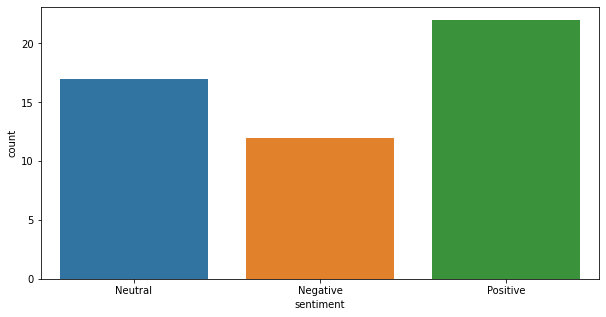

In [233]:
plt.figure(figsize=(10,5))
sns.countplot(tweets_df2['sentiment'])

<Figure size 720x360 with 0 Axes>

<AxesSubplot:ylabel='sentiment'>

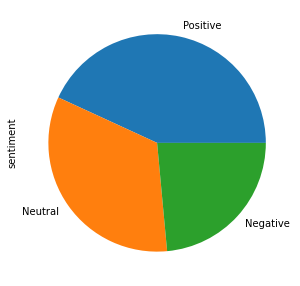

In [234]:
plt.figure(figsize=(10,5))
tweets_df2['sentiment'].value_counts().plot(kind='pie')

<Figure size 1440x720 with 0 Axes>

<AxesSubplot:xlabel='words', ylabel='scores'>

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
 [Text(0, 0, 'vaccines'),
  Text(1, 0, 'COVID19'),
  Text(2, 0, 'Covid19'),
  Text(3, 0, 'vaccine'),
  Text(4, 0, 'donated'),
  Text(5, 0, 'Vaccine'),
  Text(6, 0, 'death'),
  Text(7, 0, 'amp'),
  Text(8, 0, 'Covid'),
  Text(9, 0, 'pretty'),
  Text(10, 0, 'illness'),
  Text(11, 0, 'link'),
  Text(12, 0, 'Quad'),
  Text(13, 0, 'countries'),
  Text(14, 0, 'provided'),
  Text(15, 0, 'Johnson'),
  Text(16, 0, 'protect'),
  Text(17, 0, 'children'),
  Text(18, 0, 'dont'),
  Text(19, 0, 'actually'),
  Text(20, 0, 'affected'),
  Text(21, 0, '2019'),
  Text(22, 0, '12'),
  Text(23, 0, 'ultralow'),
  Text(24, 0, 'temperature'),
  Text(25, 0, 'freezers'),
  Text(26, 0, 'accessories'),
  Text(27, 0, 'storage'),
  Text(28, 0, '2013'),
  Text(29, 0, 'Kitengela')])

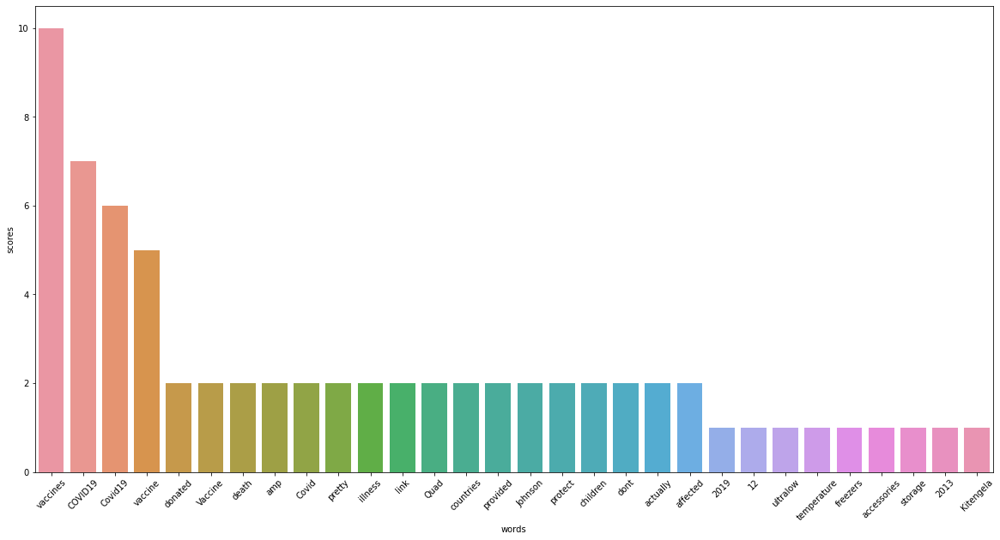

In [235]:
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neg_df)
plt.xticks(rotation=45)
plt.show()

<Figure size 1440x720 with 0 Axes>

<AxesSubplot:xlabel='words', ylabel='scores'>

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
 [Text(0, 0, 'vaccine'),
  Text(1, 0, 'COVID19'),
  Text(2, 0, 'Covid19'),
  Text(3, 0, 'vaccines'),
  Text(4, 0, 'doses'),
  Text(5, 0, 'people'),
  Text(6, 0, 'India'),
  Text(7, 0, 'de'),
  Text(8, 0, 'Vaccine'),
  Text(9, 0, 'States/UTs'),
  Text(10, 0, 'Quad'),
  Text(11, 0, 'far'),
  Text(12, 0, 'Hailed'),
  Text(13, 0, 'Cambodias'),
  Text(14, 0, 'purposive'),
  Text(15, 0, 'leadership'),
  Text(16, 0, 'ASEAN'),
  Text(17, 0, 'Cambodia'),
  Text(18, 0, 'expressed'),
  Text(19, 0, 'gratitude'),
  Text(20, 0, 'giving'),
  Text(21, 0, 'fight'),
  Text(22, 0, 'Emphasized'),
  Text(23, 0, 'enhancing'),
  Text(24, 0, 'trade'),
  Text(25, 0, 'ties'),
  Text(26, 0, 'greater'),
  Text(27, 0, 'cooperation'),
  Text(28, 0, 'health'),
  Text(29, 0, 'textile')])

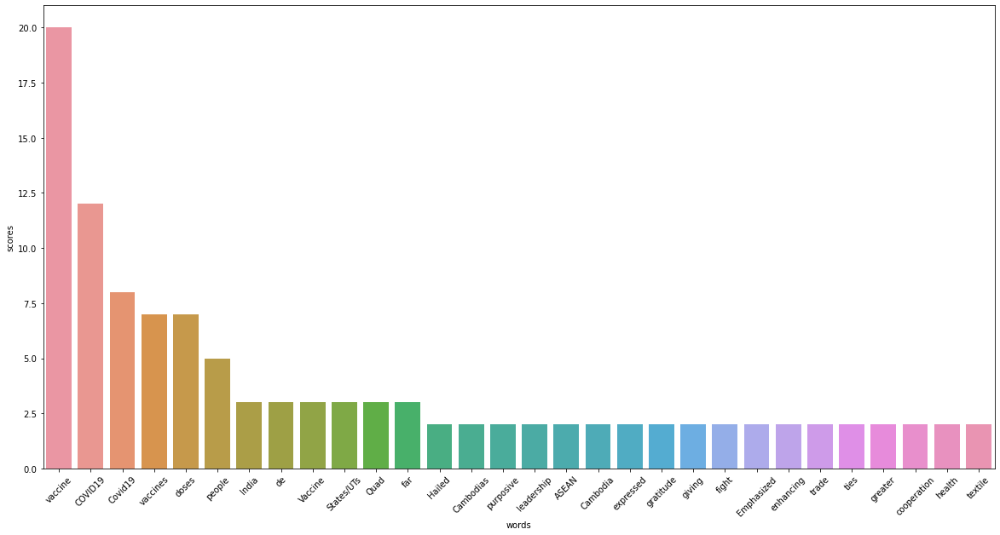

In [236]:
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=pos_df)
plt.xticks(rotation=45)
plt.show()

<Figure size 1440x720 with 0 Axes>

<AxesSubplot:xlabel='words', ylabel='scores'>

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
 [Text(0, 0, 'COVID19'),
  Text(1, 0, 'vaccine'),
  Text(2, 0, 'Covid19'),
  Text(3, 0, 'vaccines'),
  Text(4, 0, '|'),
  Text(5, 0, 'ng'),
  Text(6, 0, 'France'),
  Text(7, 0, 'nest'),
  Text(8, 0, 'à'),
  Text(9, 0, 'cas'),
  Text(10, 0, 'que'),
  Text(11, 0, 'plus'),
  Text(12, 0, 'le'),
  Text(13, 0, 'les'),
  Text(14, 0, 'gens'),
  Text(15, 0, 'vont'),
  Text(16, 0, 'protection'),
  Text(17, 0, 'population'),
  Text(18, 0, 'वैक्सीन'),
  Text(19, 0, 'Cr'),
  Text(20, 0, 'years'),
  Text(21, 0, 'President'),
  Text(22, 0, 'advisers'),
  Text(23, 0, 'mull'),
  Text(24, 0, 'booster'),
  Text(25, 0, 'Aujourdhui'),
  Text(26, 0, 'en'),
  Text(27, 0, '104007'),
  Text(28, 0, 'de'),
  Text(29, 0, 'alors')])

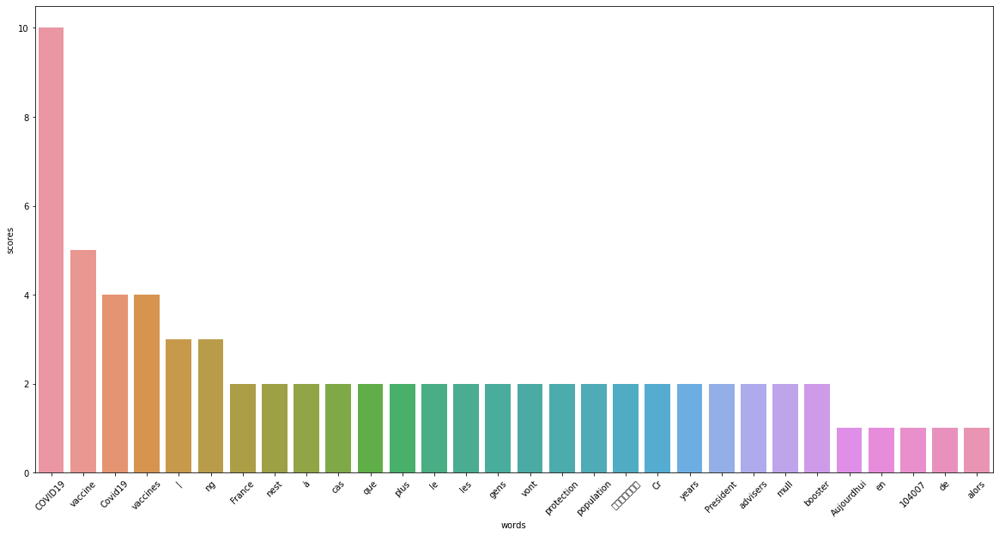

In [237]:
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neu_df)
plt.xticks(rotation=45)
plt.show()

In [238]:

#from wordcloud import WordCloud
#!pip uninstall wordcloud

In [239]:
#from wordcloud import WordCloud

In [240]:
conda install -c conda-forge wordcloud

Note: you may need to restart the kernel to use updated packages.

Solving environment: ...working... done

# All requested packages already installed.



In [241]:
from wordcloud import WordCloud

In [242]:
# create text from all tweets
def plot_wordcloud(docx):
    mywordcloud=WordCloud().generate(docx)
    plt.figure(figsize=(10, 7))
    plt.imshow(mywordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.show()


In [243]:
pos_docx = ' '.join(pos_tokens)

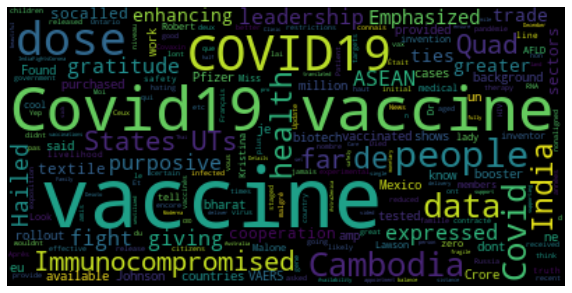

In [244]:
plot_wordcloud(pos_docx)

In [245]:
neg_docx = ' '.join(neg_tokens)

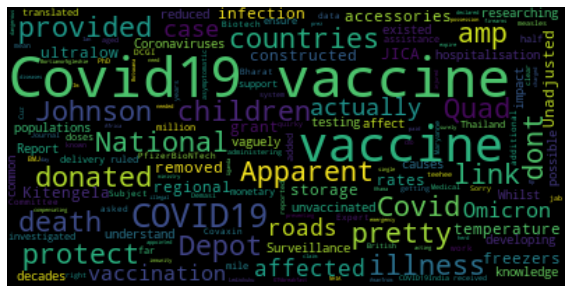

In [246]:
plot_wordcloud(neg_docx)

In [247]:
neu_docx = ' '.join(neu_tokens)

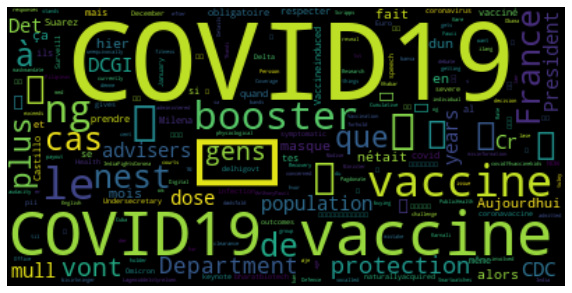

In [248]:
plot_wordcloud(neu_docx)

In [249]:
!pip install pycountry
import plotly.express as px
import pycountry
# print(df1.head) # Uncomment to see what the dataframe is like
# ----------- Step 2 ------------
df


You should consider upgrading via the 'C:\Users\mrjdh\anaconda3\python.exe -m pip install --upgrade pip' command.


,Unnamed: 0,Country,Total_cases,New_cases,Total_deaths,New_deaths,Total_recovered,New_recovered,Active_cases,Serious/critical,Total_cases/1M,Deaths/1M,Total_tests,Tests/1M,Population,Continent,%Inc_cases,%Inc_deaths,%Inc_recovered,Active
0,0,World,507700062,817512,6236176,3348,459968341,1000840,41495545,41814,65133,800,0,0,0,All,0.161023,0.053687,0.217589,41495545
1,1,USA,82553058,45204,1017609,299,80355389,34592,1180060,1492,246798,3042,999047824,2986727,334495877,North America,0.054758,0.029383,0.043049,1180060
2,2,India,43052425,2451,522116,54,42516068,1589,14241,698,30655,372,833377052,593395,1404421106,Asia,0.005693,0.010343,0.003737,14241
3,3,Brazil,30330629,18660,662556,86,29353398,12596,314675,8318,140890,3078,63776166,296249,215278697,South America,0.061522,0.012980,0.042912,314675
4,4,France,28076017,104007,144799,185,25618858,148402,2312360,1677,428423,2210,266484045,4066382,65533452,Europe,0.370448,0.127763,0.579269,2312360
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,214,Wallis and Futuna,454,0,7,0,438,0,9,0,41709,643,20508,1884061,10885,Australia/Oceania,0.000000,0.000000,0.000000,9
215,215,Montserrat,177,0,2,0,174,0,1,0,35421,400,9587,1918551,4997,North America,0.000000,0.000000,0.000000,1
216,216,Falkland Islands,128,0,0,0,0,0,0,0,34954,0,8632,2357182,3662,South America,0.000000,NaN,NaN,128
217,217,Marshall Islands,15,0,0,0,7,0,8,0,250,0,0,0,59909,Australia/Oceania,0.000000,NaN,0.000000,8


In [250]:
list_countries = df['Country'].unique().tolist()
# print(list_countries) # Uncomment to see list of countries
d_country_code = {}  # To hold the country names and their ISO
for country in list_countries:
    try:
        country_data = pycountry.countries.search_fuzzy(country)
        # country_data is a list of objects of class pycountry.db.Country
        # The first item  ie at index 0 of list is best fit
        # object of class Country have an alpha_3 attribute
        country_code = country_data[0].alpha_3
        d_country_code.update({country: country_code})
    except:
        print('could not add ISO 3 code for ->', country)
        # If could not find country, make ISO code ' '
        d_country_code.update({country: ' '})

# print(d_country_code) # Uncomment to check dictionary  

# create a new column iso_alpha in the df
# and fill it with appropriate iso 3 code
for k, v in d_country_code.items():
    df.loc[(df.Country == k), 'iso_alpha'] = v

# print(df1.head)  # Uncomment to confirm that ISO codes added
# ----------- Step 3 ------------
fig = px.choropleth(data_frame = df, 
                    locations= "iso_alpha",
                    color= "Deaths/1M",  # value in column 'Confirmed' determines color
                    hover_name= "Country",
                    color_continuous_scale='ylorrd') #  color scale red, yellow green
                   # animation_frame= "New_deaths")

fig.show()

could not add ISO 3 code for -> World
could not add ISO 3 code for -> S. Korea
could not add ISO 3 code for -> UAE
could not add ISO 3 code for -> Laos
could not add ISO 3 code for -> DRC
could not add ISO 3 code for -> Ivory Coast
could not add ISO 3 code for -> Channel Islands
could not add ISO 3 code for -> Faeroe Islands
could not add ISO 3 code for -> Caribbean Netherlands
could not add ISO 3 code for -> St. Vincent Grenadines
could not add ISO 3 code for -> St. Barth
could not add ISO 3 code for -> Saint Pierre Miquelon


In [251]:
list_countries = df['Country'].unique().tolist()
# print(list_countries) # Uncomment to see list of countries
d_country_code = {}  # To hold the country names and their ISO
for country in list_countries:
    try:
        country_data = pycountry.countries.search_fuzzy(country)
        # country_data is a list of objects of class pycountry.db.Country
        # The first item  ie at index 0 of list is best fit
        # object of class Country have an alpha_3 attribute
        country_code = country_data[0].alpha_3
        d_country_code.update({country: country_code})
    except:
        print('could not add ISO 3 code for ->', country)
        # If could not find country, make ISO code ' '
        d_country_code.update({country: ' '})

# print(d_country_code) # Uncomment to check dictionary  

# create a new column iso_alpha in the df
# and fill it with appropriate iso 3 code
for k, v in d_country_code.items():
    df.loc[(df.Country == k), 'iso_alpha'] = v

# print(df1.head)  # Uncomment to confirm that ISO codes added
# ----------- Step 3 ------------
fig = px.choropleth(data_frame = df, 
                    locations= "iso_alpha",
                    color= "New_recovered",  # value in column 'Confirmed' determines color
                    hover_name= "Country",
                    range_color=(0,155945),
                    color_continuous_scale='RdYlGn') #  color scale red, yellow green
                   # animation_frame= "New_deaths")

fig.show()

could not add ISO 3 code for -> World
could not add ISO 3 code for -> S. Korea
could not add ISO 3 code for -> UAE
could not add ISO 3 code for -> Laos
could not add ISO 3 code for -> DRC
could not add ISO 3 code for -> Ivory Coast
could not add ISO 3 code for -> Channel Islands
could not add ISO 3 code for -> Faeroe Islands
could not add ISO 3 code for -> Caribbean Netherlands
could not add ISO 3 code for -> St. Vincent Grenadines
could not add ISO 3 code for -> St. Barth
could not add ISO 3 code for -> Saint Pierre Miquelon


In [252]:
list_countries = df['Country'].unique().tolist()
# print(list_countries) # Uncomment to see list of countries
d_country_code = {}  # To hold the country names and their ISO
for country in list_countries:
    try:
        country_data = pycountry.countries.search_fuzzy(country)
        # country_data is a list of objects of class pycountry.db.Country
        # The first item  ie at index 0 of list is best fit
        # object of class Country have an alpha_3 attribute
        country_code = country_data[0].alpha_3
        d_country_code.update({country: country_code})
    except:
        print('could not add ISO 3 code for ->', country)
        # If could not find country, make ISO code ' '
        d_country_code.update({country: ' '})

# print(d_country_code) # Uncomment to check dictionary  

# create a new column iso_alpha in the df
# and fill it with appropriate iso 3 code
for k, v in d_country_code.items():
    df.loc[(df.Country == k), 'iso_alpha'] = v

# print(df1.head)  # Uncomment to confirm that ISO codes added
# ----------- Step 3 ------------
fig = px.choropleth(data_frame = df, 
                    locations= "iso_alpha",
                    color= "New_cases",  # value in column 'Confirmed' determines color
                    hover_name= "Country",
                    range_color=(0, 116093),
                    color_continuous_scale='ylorrd') #  color scale red, yellow green
                   # animation_frame= "New_deaths")

fig.show()

could not add ISO 3 code for -> World
could not add ISO 3 code for -> S. Korea
could not add ISO 3 code for -> UAE
could not add ISO 3 code for -> Laos
could not add ISO 3 code for -> DRC
could not add ISO 3 code for -> Ivory Coast
could not add ISO 3 code for -> Channel Islands
could not add ISO 3 code for -> Faeroe Islands
could not add ISO 3 code for -> Caribbean Netherlands
could not add ISO 3 code for -> St. Vincent Grenadines
could not add ISO 3 code for -> St. Barth
could not add ISO 3 code for -> Saint Pierre Miquelon


In [253]:
data_active=df.nlargest(5, 'New_recovered')

In [254]:
data_active

,Unnamed: 0,Country,Total_cases,New_cases,Total_deaths,New_deaths,Total_recovered,New_recovered,Active_cases,Serious/critical,...,Deaths/1M,Total_tests,Tests/1M,Population,Continent,%Inc_cases,%Inc_deaths,%Inc_recovered,Active,iso_alpha
0,0,World,507700062,817512,6236176,3348,459968341,1000840,41495545,41814,...,800,0,0,0,All,0.161023,0.053687,0.217589,41495545,
5,5,Germany,23915437,139849,134284,390,20853100,243700,2928053,1980,...,1594,122332384,1451739,84266089,Europe,0.584765,0.290429,1.168651,2928053,DEU
4,4,France,28076017,104007,144799,185,25618858,148402,2312360,1677,...,2210,266484045,4066382,65533452,Europe,0.370448,0.127763,0.579269,2312360,FRA
6,6,UK,21909509,19472,173032,646,20653583,71883,1082894,349,...,2525,514563763,7508832,68527802,Europe,0.088875,0.373341,0.348041,1082894,UGA
26,26,Israel,4047693,2699,10658,0,4009152,67311,27883,220,...,1143,41373364,4436346,9326000,Asia,0.066680,0.000000,1.678934,27883,ISR


In [255]:
vac_df

,Unnamed: 0,location,total_doses,New_doses_oneday,new_doses_sixtydays,fully_vaccinated,percentage
0,0,Worldwide,11493541038,5610182,0.0,4627183951,59.5%
1,1,China (Mainland),3317463000,0,0.0,1246769000,88.9%
2,2,India,1868475798,744947,0.0,845392713,62.1%
3,3,United States,570485199,19387,0.0,219047079,66.5%
4,4,Brazil,426002158,700965,0.0,163106069,77.2%
5,5,Indonesia,394736427,1487536,0.0,163036814,61.1%
6,6,Japan,266889958,428374,0.0,101238428,80.4%
7,7,Bangladesh,256016234,208075,0.0,115817367,68.8%
8,8,Pakistan,244920963,159016,0.0,120936554,55.2%
9,9,Vietnam,203144374,0,0.0,77754108,80.8%


In [256]:
list_countries_vac = vac_df['location'].unique().tolist()
# print(list_countries) # Uncomment to see list of countries
d_country_code_vac = {}  # To hold the country names and their ISO
for country_vac in list_countries_vac:
    try:
        country_data_vac = pycountry.countries.search_fuzzy(country_vac)
        # country_data is a list of objects of class pycountry.db.Country
        # The first item  ie at index 0 of list is best fit
        # object of class Country have an alpha_3 attribute
        country_code_vac = country_data_vac[0].alpha_3
        d_country_code_vac.update({country_vac: country_code_vac})
    except:
        print('could not add ISO 3 code for ->', country_vac)
        # If could not find country, make ISO code ' '
        d_country_code_vac.update({country_vac: ' '})

# print(d_country_code) # Uncomment to check dictionary  

# create a new column iso_alpha in the df
# and fill it with appropriate iso 3 code
for k, v in d_country_code_vac.items():
    vac_df.loc[(vac_df.location == k), 'iso_alpha'] = v

# print(df1.head)  # Uncomment to confirm that ISO codes added
# ----------- Step 3 ------------
fig = px.choropleth(data_frame = vac_df, 
                    locations= "iso_alpha",
                    color= "percentage",  # value in column 'Confirmed' determines color
                    hover_name= "location",
                    color_continuous_scale='RdYlGn') #  color scale red, yellow green
                   # animation_frame= "New_deaths")

fig.show()

could not add ISO 3 code for -> Worldwide
could not add ISO 3 code for -> China (Mainland)
could not add ISO 3 code for -> Myanmar (Burma)


In [257]:
df_cases1

,Active_cases
Continent,
Africa,482805
Asia,3361863
Australia/Oceania,438054
Europe,12125723
North America,2474928
South America,643001


In [258]:
data_map=vac_df_pop.nlargest(40, 'percentage')

In [259]:
data_map

,location,percentage
39,Cambodia,92
33,Chile,91
1,China (Mainland),88
40,Cuba,88
20,South Korea,86
21,Spain,85
29,Australia,83
22,Argentina,82
23,Canada,82
27,Peru,82


In [260]:
vac_df_pop

,location,percentage
0,Worldwide,59
1,China (Mainland),88
2,India,62
3,United States,66
4,Brazil,77
5,Indonesia,61
6,Japan,80
7,Bangladesh,68
8,Pakistan,55
9,Vietnam,80


In [261]:
list_countries_map = data_map['location'].unique().tolist()
# print(list_countries) # Uncomment to see list of countries
d_country_code_map = {}  # To hold the country names and their ISO
for country_map in list_countries_map:
    try:
        country_data_map = pycountry.countries.search_fuzzy(country_map)
        # country_data is a list of objects of class pycountry.db.Country
        # The first item  ie at index 0 of list is best fit
        # object of class Country have an alpha_3 attribute
        country_code_map = country_data_map[0].alpha_3
        d_country_code_map.update({country_map: country_code_map})
    except:
        print('could not add ISO 3 code for ->', country_map)
        # If could not find country, make ISO code ' '
        d_country_code_map.update({country_map: ' '})

# print(d_country_code) # Uncomment to check dictionary  

# create a new column iso_alpha in the df
# and fill it with appropriate iso 3 code
for k, v in d_country_code_map.items():
    data_map.loc[(data_map.location == k), 'iso_alpha'] = v

# print(df1.head)  # Uncomment to confirm that ISO codes added
# ----------- Step 3 ------------
fig = px.choropleth(data_frame = data_map, 
                    locations= "iso_alpha",
                    color= "percentage",  # value in column 'Confirmed' determines color
                    hover_name= "location",
                    color_continuous_scale='RdYlGn') #  color scale red, yellow green
                   # animation_frame= "New_deaths")

fig.show()

could not add ISO 3 code for -> China (Mainland)
could not add ISO 3 code for -> Worldwide
could not add ISO 3 code for -> Myanmar (Burma)
